## DATA MINING PROJECT  - Customer Segmentation

**Group Members:**  
Inês Ribeiro - 20210595  
José Dias - 20211009   

**Msc:** Data Science and Advanced Analytics - Major in Data Science @ NOVA IMS  
**Course:** Data Mining  
2021/2022

# Table of Contents
- 1) [Imports](#imports)   
- 2) [Loading Data](#LoadingData)   
- 3) [Data Preparation](#DataPreparation)   
    - 3.1) [Initial Analysis](#InitialAnalysis)    
    - 3.2) [Data Visualization](#DataVisualization)
- 4) [Data Preprocessing](#DataPreprocessing)  
    - 4.1) [Coherence Checks](#CoherenceChecks) 
        - 4.1.1) [Handling Coherence Issues In Numerical Variables](#NumericalVariables) 
        - 4.1.2) [Coherence Check on Categorical Variables](#CategoricalVariables)         
    - 4.2) [Missing Values](#MissingValues)      
    - 4.3) [Outliers](#Outliers)       
    - 4.4) [Missing Values (Continuation)](#MissingValuesCont)      
    - 4.5) [Feature Engineering](#FeatureEngineering)          
    - 4.6) [Feature Selection](#FeatureSelection)           
        - 4.6.1) [Metric Features](#FSMetricFeatures) 
        - 4.6.2) [Categorical Features](#FSCategoricalFeatures)        
    - 4.7) [Data Normalization](#DataNormalization)       
- 5) [Clustering](#Clustering)        
    - 5.1) [Density Based Clustering - DBSCAN](#DBSCAN)      
        - 5.1.1) [Value Perspective](#DBSCANvalue)       
        - 5.1.2) [Consumption Perspective](#DBSCANcons)  
    - 5.2) [K-Prototypes + Hieralchical](#kprot)          
    - 5.3) [K-means + Hierarchical Clustering](#KMH)  
        - 5.3.1) [Value Perspective](#KMHvalue)   
        - 5.3.2) [Consumption Perspective](#KMHcons)           
    - 5.4) [Self-organizing Maps + Hierarchical Clustering](#SOMH)  
        - 5.4.1) [Value Perspective](#SOMHvalue)      
        - 5.4.2) [Consumption Perspective](#SOMHcons)          
    - 5.5) [Cluster Analysis](#ClusterAnalysis)  
        - 5.5.1) [Merging the Perspectives](#MergePerpectives)      
        - 5.5.2) [Cluster Profiles](#ClusterProfiles)            
        - 5.5.3) [Cluster visualization](#ClusterVisualization)
            - 5.5.3.1) [t-SNE](#tsne)            
            - 5.5.3.2) [UMAP](#umap)            
        - 5.5.4) [Assess feature importance and reclassify outliers](#FeatImport)       
            - 5.5.4.1) [Using the R²](#FeatImportR2)                    
            - 5.5.4.2) [Using a Decision Tree](#FeatImportdt)  
        - 5.5.5) [t-SNE with the outliers](#tsneout)              

# 1) Imports <a name="imports"></a>

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pylab as plt
import seaborn as sns
from math import ceil

from sklearn.impute import KNNImputer
from sklearn.neighbors import KNeighborsClassifier

import sklearn.preprocessing as prep
import statsmodels.api as statsm 


from scipy import stats
from sklearn.cluster import KMeans


from sklearn.preprocessing import MinMaxScaler, StandardScaler

from sklearn.cluster import KMeans
from sklearn.decomposition import PCA


from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import accuracy_score

from sklearn.ensemble import ExtraTreesClassifier
from sklearn.neighbors import NearestNeighbors
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth

from kmodes.kprototypes import KPrototypes as KP
import pydotplus
from IPython.display import Image
#Scipy
import scipy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy

from kmodes.kmodes import KModes


import scipy
from scipy.cluster.hierarchy import dendrogram, linkage
from scipy.cluster import hierarchy
from pylab import rcParams


import sklearn
from sklearn.cluster import AgglomerativeClustering
import sklearn.metrics as sm

from sklearn.cluster import DBSCAN
from sklearn import metrics

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


from sklearn.cluster import MeanShift, estimate_bandwidth

from sklearn import mixture

from yellowbrick.cluster import KElbowVisualizer

import sompy
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView
from sompy.visualization.hitmap import HitMapView

from sklearn.base import clone

from sklearn.metrics import pairwise_distances


from sklearn.tree import DecisionTreeClassifier, export_graphviz
from sklearn.model_selection import train_test_split
import graphviz
import logging
logging.getLogger('matplotlib.font_manager').disabled = True
logging.getLogger("matplotlib").setLevel(logging.WARNING)


from sompy.sompy import SOMFactory
from sompy.visualization.plot_tools import plot_hex_map
from sompy.visualization.mapview import View2DPacked
from sompy.visualization.mapview import View2D
from sompy.visualization.bmuhits import BmuHitsView

deprecate positional args: graphviz.backend.piping.pipe(['renderer', 'formatter', 'quiet'])
deprecate positional args: graphviz.backend.rendering.render(['renderer', 'formatter', 'quiet'])
deprecate positional args: graphviz.backend.unflattening.unflatten(['stagger', 'fanout', 'chain', 'encoding'])
deprecate positional args: graphviz.backend.viewing.view(['quiet'])
deprecate positional args: graphviz.quoting.quote(['is_html_string', 'is_valid_id', 'dot_keywords', 'escape_unescaped_quotes'])
deprecate positional args: graphviz.quoting.a_list(['kwargs', 'attributes'])
deprecate positional args: graphviz.quoting.attr_list(['kwargs', 'attributes'])
deprecate positional args: graphviz.dot.Dot.clear(['keep_attrs'])
deprecate positional args: graphviz.dot.Dot.__iter__(['subgraph'])
deprecate positional args: graphviz.dot.Dot.node(['_attributes'])
deprecate positional args: graphviz.dot.Dot.edge(['_attributes'])
deprecate positional args: graphviz.dot.Dot.attr(['_attributes'])
deprecate positi

In [248]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.impute import KNNImputer
from sklearn.decomposition import PCA
from sklearn.preprocessing import MinMaxScaler, StandardScaler, OneHotEncoder


%matplotlib inline

from math import ceil
from sklearn.cluster import KMeans


import warnings
warnings.filterwarnings('ignore')
from sklearn.model_selection import train_test_split

from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.metrics import accuracy_score
from datetime import datetime
from datetime import date
from scipy.stats import chi2_contingency
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn.ensemble import ExtraTreesClassifier

from sklearn.metrics import silhouette_score, silhouette_samples
from sklearn.cluster import AgglomerativeClustering, KMeans
from scipy.cluster.hierarchy import dendrogram

from sklearn.neighbors import NearestNeighbors
from sklearn.mixture import GaussianMixture
from sklearn.cluster import MeanShift, DBSCAN, estimate_bandwidth

import matplotlib.cm as cm
from sklearn.manifold import TSNE

from umap import UMAP
import plotly.express as px
from sklearn import tree

# 2) Loading Data <a name="LoadingData"></a>

In [3]:
# reading dataset and storing it in variable 'data_original'
data_original = pd.read_sas('a2z_insurance.sas7bdat')

NumExpr defaulting to 8 threads.


In [4]:
data = data_original.copy()

In [5]:
#Checking how many rows and columns are in the dataset
initial_row_count = data.shape[0]
initial_column_count = data.shape[1]

print('The dataset has', initial_row_count, 'rows, and', initial_column_count, 'columns')

The dataset has 10296 rows, and 14 columns


In [6]:
data.head()

,CustID,FirstPolYear,BirthYear,EducDeg,MonthSal,GeoLivArea,Children,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,1982.0,b'2 - High School',2177.0,1.0,1.0,380.97,0.39,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,1995.0,b'2 - High School',677.0,4.0,1.0,-131.13,1.12,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,1970.0,b'1 - Basic',2277.0,3.0,0.0,504.67,0.28,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1981.0,b'3 - BSc/MSc',1099.0,4.0,1.0,-16.99,0.99,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1973.0,b'3 - BSc/MSc',1763.0,4.0,1.0,35.23,0.90,338.62,47.80,182.59,18.78,41.45


In [7]:
#Checking some basic statistics for our Numerical features
data.describe(include='all').T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
CustID,10296.0,NaN,NaN,NaN,5148.5,2972.34352,1.0,2574.75,5148.5,7722.25,10296.0
FirstPolYear,10266.0,NaN,NaN,NaN,1991.062634,511.267913,1974.0,1980.0,1986.0,1992.0,53784.0
BirthYear,10279.0,NaN,NaN,NaN,1968.007783,19.709476,1028.0,1953.0,1968.0,1983.0,2001.0
EducDeg,10279,4,b'3 - BSc/MSc',4799,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthSal,10260.0,NaN,NaN,NaN,2506.667057,1157.449634,333.0,1706.0,2501.5,3290.25,55215.0
GeoLivArea,10295.0,NaN,NaN,NaN,2.709859,1.266291,1.0,1.0,3.0,4.0,4.0
Children,10275.0,NaN,NaN,NaN,0.706764,0.455268,0.0,0.0,1.0,1.0,1.0
CustMonVal,10296.0,NaN,NaN,NaN,177.892605,1945.811505,-165680.42,-9.44,186.87,399.7775,11875.89
ClaimsRate,10296.0,NaN,NaN,NaN,0.742772,2.916964,0.0,0.39,0.72,0.98,256.2
PremMotor,10262.0,NaN,NaN,NaN,300.470252,211.914997,-4.11,190.59,298.61,408.3,11604.42


In [8]:
#Check for missing values
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10296 entries, 0 to 10295
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10296 non-null  float64
 1   FirstPolYear   10266 non-null  float64
 2   BirthYear      10279 non-null  float64
 3   EducDeg        10279 non-null  object 
 4   MonthSal       10260 non-null  float64
 5   GeoLivArea     10295 non-null  float64
 6   Children       10275 non-null  float64
 7   CustMonVal     10296 non-null  float64
 8   ClaimsRate     10296 non-null  float64
 9   PremMotor      10262 non-null  float64
 10  PremHousehold  10296 non-null  float64
 11  PremHealth     10253 non-null  float64
 12  PremLife       10192 non-null  float64
 13  PremWork       10210 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.1+ MB


**Initial Observations**  

After looking at the dataframe, we noticed we have to have to do some data preparation and pre processing, mainly due to incoherent data, outliers and missing values before any analysis can take place.


# 3) Data Preparation <a name="DataPreparation"></a>

## 3.1) Initial Analysis <a name="InitialAnalysis"></a>

In [9]:
#droping the duplicates from the dataframe (excluding the CustID)
cols_without_customerId = data.columns.tolist()[1:]
data = data.drop_duplicates(subset=cols_without_customerId)

In [10]:
#with drop duplicates, 3 rows were eliminated
data.shape

(10293, 14)

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 10293 entries, 0 to 10295
Data columns (total 14 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   CustID         10293 non-null  float64
 1   FirstPolYear   10263 non-null  float64
 2   BirthYear      10276 non-null  float64
 3   EducDeg        10276 non-null  object 
 4   MonthSal       10257 non-null  float64
 5   GeoLivArea     10292 non-null  float64
 6   Children       10272 non-null  float64
 7   CustMonVal     10293 non-null  float64
 8   ClaimsRate     10293 non-null  float64
 9   PremMotor      10259 non-null  float64
 10  PremHousehold  10293 non-null  float64
 11  PremHealth     10250 non-null  float64
 12  PremLife       10189 non-null  float64
 13  PremWork       10207 non-null  float64
dtypes: float64(13), object(1)
memory usage: 1.2+ MB


After droping the the duplicates, we noticed we have more missing values than originally noticed.  
Also, we have at least one categorical variable: EducDeg

In [12]:
#Checking the amount of missing values we have in the dataframe
data.isna().sum()

CustID             0
FirstPolYear      30
BirthYear         17
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

We decided to handle the missing values further down in our analysis.

**Correcting dtypes of some variables**

In [13]:
#Changing datatype ofthe categorical features to object
data['GeoLivArea'] = data['GeoLivArea'].astype(object)
data['Children'] = data['Children'].astype(object)

## 3.2) Data Visualization <a name="DataVisualization"></a>

In [14]:
# Define metric and non metric
non_metric_features = ["EducDeg", "GeoLivArea", "Children"]
metric_features = data.columns.drop(non_metric_features).to_list()

#Create dataframe with only the metric and the non-metric features
df_non_metric_features = data[non_metric_features].copy() 
df_metric_features = data.loc[:, ~data.columns.isin(non_metric_features)].copy()

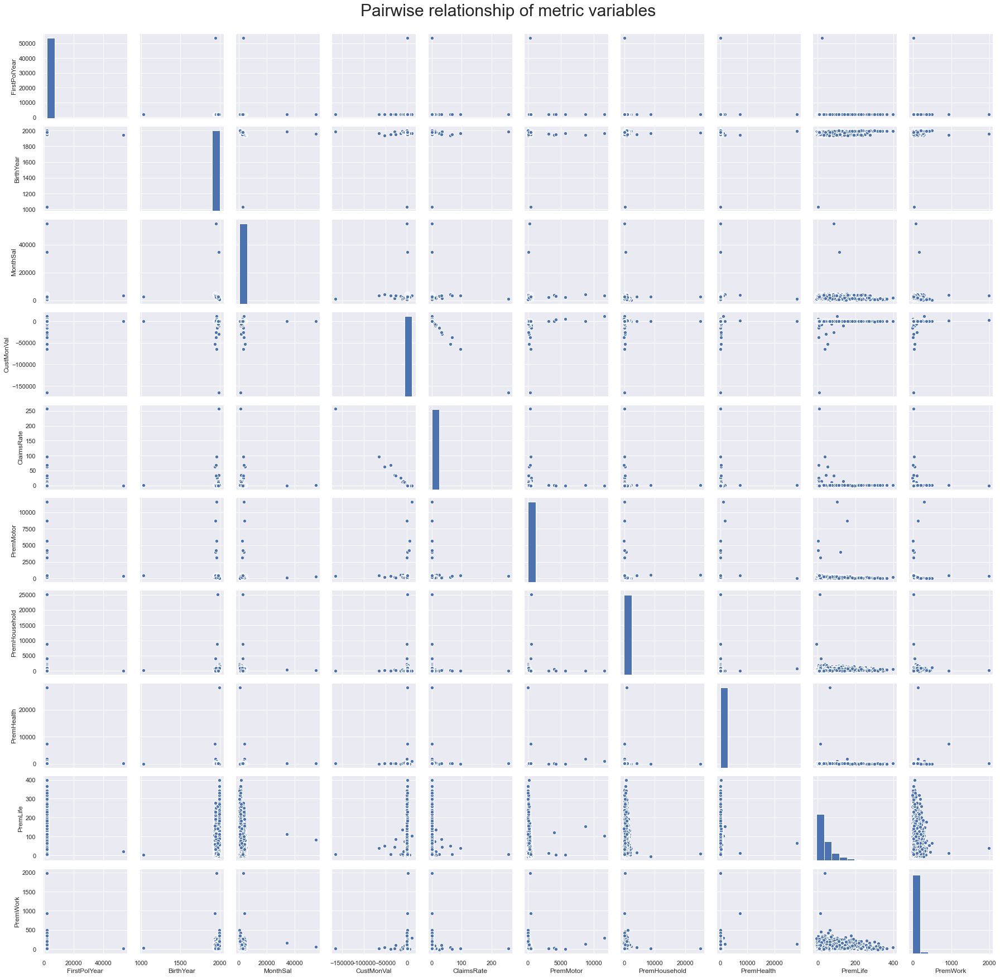

In [15]:
sns.set()

# Setting pairgrid
g = sns.PairGrid(df_metric_features.drop("CustID",1).dropna())

# Populating pairgrid
mdg = g.map_diag(plt.hist, edgecolor="w")
mog = g.map_offdiag(plt.scatter, edgecolor="w", s=40)
    
# Layout
plt.subplots_adjust(top=0.95)
plt.suptitle("Pairwise relationship of metric variables", fontsize=30)

plt.show()

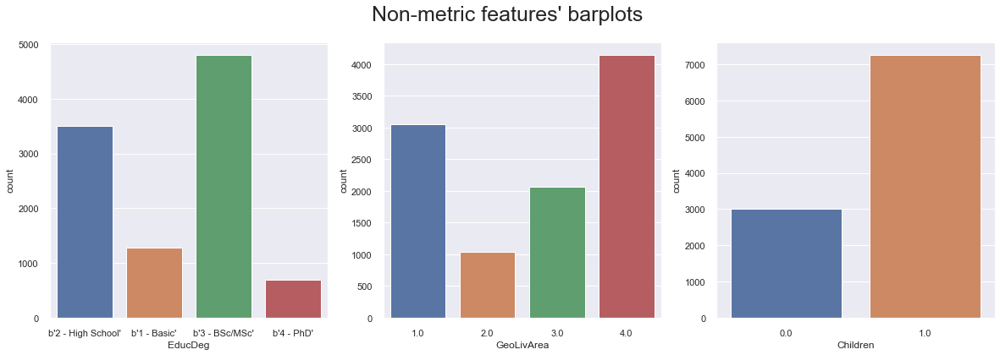

In [16]:
# Non Metric Variables' barplots
sns.set()


fig, axes = plt.subplots(ceil(len(df_non_metric_features.columns)/3), 3, figsize=(20, 6))
plt.subplots_adjust(hspace = 0.18)

# Plot data
for ax, feat in zip(axes.flatten(), df_non_metric_features.columns):
    sns.countplot(x=df_non_metric_features[feat], ax=ax)
     
# Title
plt.suptitle("Non-metric features' barplots", fontsize=25)

plt.show()

In [17]:
def cor_heatmap(cor):
    # Prepare figure
    fig = plt.figure(figsize=(15, 10))
    
    #threshold = 0.8
    mask_annot = np.absolute(corr.values) >= 0.8
    annot = np.where(mask_annot, corr.values, np.full(corr.shape,""))

    sns.heatmap(data=corr, annot=annot, cmap=sns.diverging_palette(220, 10, as_cmap=True),
                fmt='s', vmin=-1, vmax=1, center=0, square=True, linewidths=.5)
    # Layout
    fig.subplots_adjust(top=0.95)
    fig.suptitle("Correlation Matrix", fontsize=20)    
    
    plt.show()

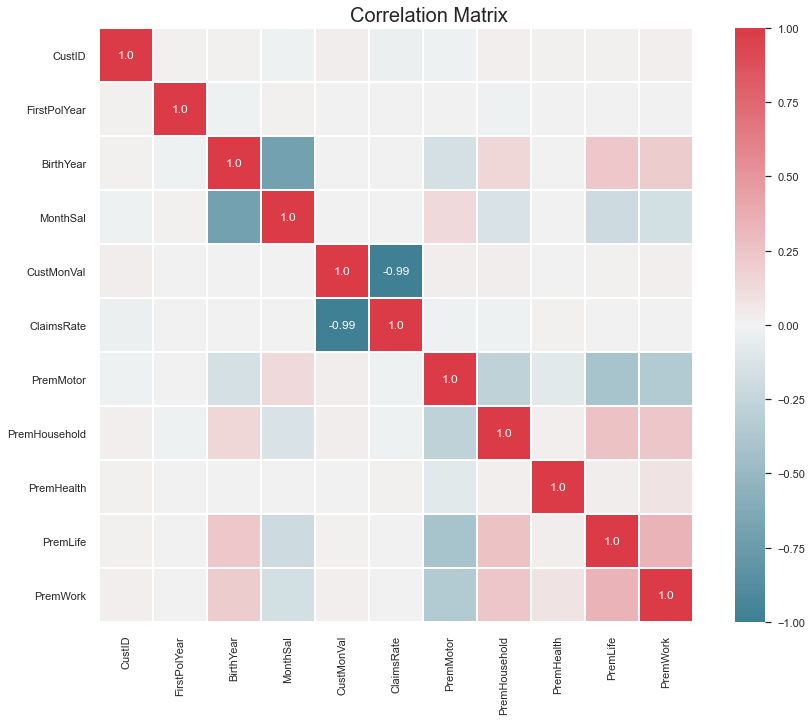

In [18]:
# Obtain correlation matrix. Round the values to 2 decimal cases.
corr = np.round(df_metric_features.corr(method="pearson"), decimals=2)
cor_heatmap(corr)

# 4) Data Preprocessing <a name="DataPreprocessing"></a>
## 4.1) Coherence Checks <a name="CoherenceChecks"></a>

### 4.1.1) Handling Coherence Issues In Numerical Variables <a name="NumericalVariables"></a>

We will go through each variable, one by one, and fix any issues we might find.

In [19]:
#Checking the statistical description of our variables
data.describe()

,CustID,FirstPolYear,BirthYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
count,10293.000000,10263.000000,10276.000000,10257.000000,10293.000000,10293.000000,10259.00000,10293.000000,10250.000000,10189.000000,10207.000000
mean,5147.504712,1991.064893,1968.006909,2506.618699,177.929963,0.742728,300.50155,210.419863,171.553183,41.848724,41.283712
std,2972.180611,511.342617,19.710742,1157.518390,1946.091554,2.917385,211.93774,352.635041,296.444399,47.484264,51.519022
min,1.000000,1974.000000,1028.000000,333.000000,-165680.420000,0.000000,-4.11000,-75.000000,-2.110000,-7.000000,-12.000000
25%,2574.000000,1980.000000,1953.000000,1706.000000,-9.440000,0.390000,190.59000,49.450000,111.800000,9.890000,10.670000
50%,5147.000000,1986.000000,1968.000000,2502.000000,187.030000,0.720000,298.61000,132.800000,162.810000,25.560000,25.670000
75%,7720.000000,1992.000000,1983.000000,3290.000000,399.860000,0.980000,408.30000,290.050000,219.040000,57.790000,56.790000
max,10296.000000,53784.000000,2001.000000,55215.000000,11875.890000,256.200000,11604.42000,25048.800000,28272.000000,398.300000,1988.700000


Out of these, we will skip over any categorical or binary variables such as: 'GeoLivArea' (categorical) and 'Children' (binary). 

**Variable FirstPolYear**

In [20]:
data['FirstPolYear'].describe()

count    10263.000000
mean      1991.064893
std        511.342617
min       1974.000000
25%       1980.000000
50%       1986.000000
75%       1992.000000
max      53784.000000
Name: FirstPolYear, dtype: float64

The first thing we noticed is the max value of this variable: 53784. This cannot be an accepted value because we are working with a dataset of values up to the year 2016.  

Because of this, we decided to remove any values above the year 2016

In [21]:
#Create a new column with value 1 for any observation above 2016, and 0 for all others
data['Coherence_FirstPolYear'] = data['FirstPolYear'].apply(lambda x: 1 if x > 2016 else 0)

In [22]:
#Remove the observations with value 1 in the newly created column
data = data[data['Coherence_FirstPolYear'] == 0]

In [23]:
data.shape

(10292, 15)

After this coherence check, we have one less observation.

In [24]:
#Delete column after it is no longer necessary
del data['Coherence_FirstPolYear']

**Variable BirthYear**

In [25]:
data['BirthYear'].describe()

count    10275.000000
mean      1968.008856
std         19.710712
min       1028.000000
25%       1953.000000
50%       1968.000000
75%       1983.000000
max       2001.000000
Name: BirthYear, dtype: float64

In this variable we have an acceptable max value, however, the min value (1028) is not. As such, we decided to have a maximum age of 120 years old, which is the age of the oldest person alive on Earth, and remove any other values above that threshold. 

In [26]:
#Creating new column with value 1 for any observation above 120 years old, and 0 for all others
data['Coherence_BirthYear'] = data['BirthYear'].apply(lambda x: 1 if (x>2016 or x<1896) else 0)

In [27]:
#Remove the observations with value 1 in the newly created column
data = data[data['Coherence_BirthYear'] == 0]

In [28]:
data.shape

(10291, 15)

After this coherence check, we have one less observation.

One other check we want to do is if the Customer's 'FirstPolYear' is after or the same as it's 'BirthYear'. We want to do this because a customer cannot be a customer before they are born

In [29]:
#Number of customers that became customers before the year they were born
data[(data['FirstPolYear'] - data['BirthYear']) < 0].shape[0]

1997

There are too many observations. This might be because of human error when inserting the data into the database, or because the customers may have lied when asked about the year they were born. In any occasion, the high amount of data makes us question the validity of the remaining data, and therefore, instead of removing the rows, it makes more sense to remove the column 'BirthYear'.

In [30]:
#removing the column BirthYear
del data['BirthYear']

In [31]:
#delete column after it is no longer necessary
del data['Coherence_BirthYear']

**Variable MonthSal**

In [32]:
data['MonthSal'].describe()

count    10255.000000
mean      2506.512921
std       1157.602441
min        333.000000
25%       1706.000000
50%       2501.000000
75%       3290.500000
max      55215.000000
Name: MonthSal, dtype: float64

Another coherence check we can do is removing any customers who spend more than their annual income on insurances. Although a customer can spend more than what they earn, it is very unlikely for someone to spend all of their income and then some more on insurances.

In [33]:
data['Coherence_MonthSal'] = data.apply(lambda x:1 if (sum([x['PremMotor'], x['PremHousehold'], x['PremHealth'], x['PremLife'], x['PremWork']])>(x['MonthSal'] * 12)) else 0, axis=1)

In [34]:
data['Coherence_MonthSal'].value_counts()

0    10290
1        1
Name: Coherence_MonthSal, dtype: int64

We get one customer that spends more than their annual income on insurances. We decided to remove that observation.

In [35]:
#Remove the observations with value 1 in the newly created column
data = data[data['Coherence_MonthSal'] == 0]

In [36]:
#Delete column after it is no longer necessary
del data['Coherence_MonthSal']

**Other Variables**  

Regarding the other variables in the dataset, there are no other coherence checks to be done so we will move on to analysing the variables for any outliers.

### 4.1.2) Coherence Check on Categorical Variables <a name="CategoricalVariables"></a>

There is no need to perform a coherence check on our categorical variables because of the results we observed when plotting the barplot of each one.

## 4.2) Missing Values <a name="MissingValues"></a>

In [37]:
data.isna().sum()

CustID             0
FirstPolYear      30
EducDeg           17
MonthSal          36
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        43
PremLife         104
PremWork          86
dtype: int64

In [38]:
#Checking missing values per features
percent_missing = data.isnull().sum() * 100 / len(data)
missing_value_df = pd.DataFrame({'column_name': data.columns,
                                 'percent_missing': percent_missing})

In [39]:
missing_value_df

,column_name,percent_missing
CustID,CustID,0.000000
FirstPolYear,FirstPolYear,0.291545
EducDeg,EducDeg,0.165209
MonthSal,MonthSal,0.349854
GeoLivArea,GeoLivArea,0.009718
Children,Children,0.204082
CustMonVal,CustMonVal,0.000000
ClaimsRate,ClaimsRate,0.000000
PremMotor,PremMotor,0.330418
PremHousehold,PremHousehold,0.000000


We will use different methods to fill the missing values, depending on the type of variable and on the variable itself.
There are no features that have more than 20% missing values, therefore, for now, we will not remove any features.

## 4.3) Outliers <a name="Outliers"></a>

**Function to update the Metric and Non-Metric Variables**

In [40]:
#Function to update metric and categorical features automatically
def update_metric_feat(df):
    metric_features = df.select_dtypes(include=np.number).columns
    non_metric_features = df.select_dtypes(exclude=np.number).columns
    return metric_features.tolist(),non_metric_features.tolist()

In [41]:
#update metric and non-metric features
metric_features = update_metric_feat(data)[0]
non_metric_features = update_metric_feat(data)[1]

In [42]:
#Filling in the missing values with the Median, to be able to handle the outliers
data_med = data.copy()

for column in metric_features:
    data_med[column] = data_med[column].fillna(data_med[column].median())
for column in non_metric_features:
    data_med[column] = data_med[column].fillna(data_med[column].mode()[0])

In [43]:
#The are no missing values in the dataframe that was filled with the median
data_med.isna().sum()

CustID           0
FirstPolYear     0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [44]:
# Dealing with outliers on the metric features:
from sklearn.neighbors import LocalOutlierFactor

# Note that: we are only finding out outliers among the metric features:
# identifying outliers in our dataset
lof = LocalOutlierFactor(n_jobs=-1)
yhat = lof.fit_predict(data_med[metric_features].values)

# select all rows that are not outliers
mask = yhat != -1

outliers_df = data_med.iloc[~mask, :].copy()

# variable that contains the original number of observations:
original_observation = data.shape[0]
data = data.drop(index=data_med.iloc[~mask, :].index)


print('There were', original_observation-data.shape[0], 'observations eliminated, corresponding to', round((1-len(data)/original_observation)*100,2),'% of the data')

There were 84 observations eliminated, corresponding to 0.82 % of the data


## 4.4) Missing Values (Continuation) <a name="MissingValuesCont"></a>

In [45]:
#Check the missing values
data.isna().sum()

CustID             0
FirstPolYear      30
EducDeg           17
MonthSal          34
GeoLivArea         1
Children          21
CustMonVal         0
ClaimsRate         0
PremMotor         34
PremHousehold      0
PremHealth        42
PremLife         104
PremWork          86
dtype: int64

**Numerical Variables (Except Premiums)**  
To start off, we will fill the missing values of all the numerical variables except the premium ones. To fill these missing values we decided to use the KNNImputer algorithm.

In [46]:
#Define metric, non-metric features and premium features.
metric_features = update_metric_feat(data)[0]
non_metric_features = update_metric_feat(data)[1]
premiums = ['PremMotor', 'PremHousehold','PremHealth', 'PremLife','PremWork']
metric_features = [x for x in metric_features if x not in premiums]
#Drop categorical columns
df_metric_features = data.drop(columns = non_metric_features)
#Drop premium columns
df_metric_features = df_metric_features.drop(columns = premiums)

df_metric_features_names = data.columns.drop(non_metric_features + premiums).tolist()

In [47]:
imputer = KNNImputer(n_neighbors=1).fit(df_metric_features)

In [48]:
filled_metric_features = imputer.transform(df_metric_features)

In [49]:
#Convert to dataframe
filled_metric_features = pd.DataFrame(filled_metric_features)

In [50]:
#Rename columns of filled_metric_features from index to real name
for i in range(len(df_metric_features_names)):
    filled_metric_features.rename(columns = {i:df_metric_features_names[i]}, inplace = True)

**Categorical Variables**  
Next, we will fill the missing values for the categorical variables using the KNN Imputer algorithm as well, however, we first have to cast the type of some variables into something we can work with.  

Looking at the categorical variables, we have to do this for the variable 'EducDeg'.

In [51]:
#Cast the column from bytes type to string type
data['EducDeg'] = data['EducDeg'].str.decode("utf-8")

In [52]:
#Transform the variable category from string to numerical representation
data['EducDeg'] = data['EducDeg'].str[:1].astype(object)

In [53]:
#Drop numerical columns
non_metric_features.append('CustID')

df_non_metric_features = data[non_metric_features]

df_non_metric_features_names = non_metric_features

In [54]:
#We used number of neighbors = 1 because to have no decimal values
imputer = KNNImputer(n_neighbors=1).fit(df_non_metric_features)

In [55]:
filled_non_metric_features = imputer.transform(df_non_metric_features)

In [56]:
#Convert to dataframe
filled_non_metric_features = pd.DataFrame(filled_non_metric_features)

In [57]:
#Rename columns of filled_non_metric_features from index to real name
for i in range(len(df_non_metric_features_names)):
    filled_non_metric_features.rename(columns = {i:df_non_metric_features_names[i]}, inplace = True)

**Premium Variables**

We considered missing values to be cases where the customer did not spend anything on that specific insurance and, as such, we replaced it with 0.

In [58]:
df_premiums = data[['CustID'] + premiums].copy()

In [59]:
#Fill the missing values of the premiums with 0
df_premiums.fillna(0, inplace = True)

In [60]:
filled_non_metric_features

,EducDeg,GeoLivArea,Children,CustID
0,2.0,1.0,1.0,1.0
1,2.0,4.0,1.0,2.0
2,1.0,3.0,0.0,3.0
3,3.0,4.0,1.0,4.0
4,3.0,4.0,1.0,5.0
...,...,...,...,...
10201,1.0,3.0,1.0,10291.0
10202,4.0,2.0,0.0,10292.0
10203,3.0,1.0,1.0,10294.0
10204,1.0,2.0,1.0,10295.0


In [61]:
#Merge the metric dataframe and non metric datafram, now without missing values
data = filled_metric_features.merge(filled_non_metric_features, on='CustID')

In [62]:
#Change the datetype to object to be able to automatically define metric and categorical features
data['EducDeg'] = data['EducDeg'].astype(object)
data['GeoLivArea'] = data['GeoLivArea'].astype(object)
data['Children'] = data['Children'].astype(object)

In [63]:
#Merge the premiums dataframe
data = data.merge(df_premiums, on='CustID')

In [64]:
data.head()

,CustID,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,EducDeg,GeoLivArea,Children,PremMotor,PremHousehold,PremHealth,PremLife,PremWork
0,1.0,1985.0,2177.0,380.97,0.39,2.0,1.0,1.0,375.85,79.45,146.36,47.01,16.89
1,2.0,1981.0,677.0,-131.13,1.12,2.0,4.0,1.0,77.46,416.20,116.69,194.48,106.13
2,3.0,1991.0,2277.0,504.67,0.28,1.0,3.0,0.0,206.15,224.50,124.58,86.35,99.02
3,4.0,1990.0,1099.0,-16.99,0.99,3.0,4.0,1.0,182.48,43.35,311.17,35.34,28.34
4,5.0,1986.0,1763.0,35.23,0.90,3.0,4.0,1.0,338.62,47.80,182.59,18.78,41.45


In [65]:
#Checking that the count of missing values is 0
data.isna().sum()

CustID           0
FirstPolYear     0
MonthSal         0
CustMonVal       0
ClaimsRate       0
EducDeg          0
GeoLivArea       0
Children         0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [66]:
#Set the Customer Id as index
data.set_index('CustID', inplace=True)

In [67]:
#Creating a backup dataframe
df_after_imputation = data.copy()

## 4.5) Feature Engineering <a name="FeatureEngineering"></a>

In [68]:
data['Client_Years'] = 2016 - data['FirstPolYear']
data['Yearly_Salary'] = 12 * data['MonthSal']
data['Total_Premiums'] = data['PremMotor'] + data['PremHousehold'] + data['PremHealth'] + data['PremLife'] + data['PremWork']

#does the customer represent a profit for the company or not?
data['Profit'] = 0
data['Profit'] = data['Profit'].where(data['ClaimsRate']>1,1)

#delete rows where total_premiums equals to 0
data = data[data['Total_Premiums'] != 0]

data['Effort_Rate'] = data['Total_Premiums'] / data['Yearly_Salary']

data['Motor_Ratio'] = data['PremMotor'] / data['Total_Premiums']
data['Motor_Ratio'] = data['Motor_Ratio'].where(data['Motor_Ratio'] > 0, 0)
data['Household_Ratio'] = data['PremHousehold'] / data['Total_Premiums']
data['Household_Ratio'] = data['Household_Ratio'].where(data['Household_Ratio'] > 0, 0)
data['Health_Ratio'] = data['PremHealth'] / data['Total_Premiums']
data['Health_Ratio'] = data['Health_Ratio'].where(data['Health_Ratio'] > 0, 0)
data['Life_Ratio'] = data['PremLife'] / data['Total_Premiums']
data['Life_Ratio'] = data['Life_Ratio'].where(data['Life_Ratio'] > 0, 0)
data['Work_Ratio'] = data['PremWork'] / data['Total_Premiums']
data['Work_Ratio'] = data['Work_Ratio'].where(data['Work_Ratio'] > 0, 0)

#did the customer cancelled at least one premium?
data["Cancelled"] = np.where(data.eval("PremMotor < 0 or PremHousehold < 0 or PremHealth < 0 or PremLife < 0 or PremWork < 0"), "1", "0")

In [69]:
data

,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,EducDeg,GeoLivArea,Children,PremMotor,PremHousehold,PremHealth,...,Yearly_Salary,Total_Premiums,Profit,Effort_Rate,Motor_Ratio,Household_Ratio,Health_Ratio,Life_Ratio,Work_Ratio,Cancelled
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,1985.0,2177.0,380.97,0.39,2.0,1.0,1.0,375.85,79.45,146.36,...,26124.0,665.56,1,0.025477,0.564712,0.119373,0.219905,0.070632,0.025377,0
2.0,1981.0,677.0,-131.13,1.12,2.0,4.0,1.0,77.46,416.20,116.69,...,8124.0,910.96,0,0.112132,0.085031,0.456881,0.128096,0.213489,0.116503,0
3.0,1991.0,2277.0,504.67,0.28,1.0,3.0,0.0,206.15,224.50,124.58,...,27324.0,740.60,1,0.027104,0.278355,0.303133,0.168215,0.116595,0.133702,0
4.0,1990.0,1099.0,-16.99,0.99,3.0,4.0,1.0,182.48,43.35,311.17,...,13188.0,600.68,1,0.045547,0.303789,0.072168,0.518030,0.058833,0.047180,0
5.0,1986.0,1763.0,35.23,0.90,3.0,4.0,1.0,338.62,47.80,182.59,...,21156.0,629.24,1,0.029743,0.538141,0.075965,0.290175,0.029846,0.065873,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291.0,1994.0,626.0,176.26,0.85,1.0,3.0,1.0,6.89,878.50,103.13,...,7512.0,1302.80,1,0.173429,0.005289,0.674317,0.079160,0.086752,0.154483,0
10292.0,1984.0,3188.0,-0.11,0.96,4.0,2.0,0.0,393.74,49.45,173.81,...,38256.0,641.56,1,0.016770,0.613723,0.077078,0.270918,0.015244,0.023038,0
10294.0,1994.0,2918.0,524.10,0.21,3.0,1.0,1.0,403.63,132.80,142.25,...,35016.0,696.24,1,0.019883,0.579728,0.190739,0.204312,0.018198,0.007023,0


In [70]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Float64Index: 10194 entries, 1.0 to 10296.0
Data columns (total 23 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   FirstPolYear     10194 non-null  float64
 1   MonthSal         10194 non-null  float64
 2   CustMonVal       10194 non-null  float64
 3   ClaimsRate       10194 non-null  float64
 4   EducDeg          10194 non-null  object 
 5   GeoLivArea       10194 non-null  object 
 6   Children         10194 non-null  object 
 7   PremMotor        10194 non-null  float64
 8   PremHousehold    10194 non-null  float64
 9   PremHealth       10194 non-null  float64
 10  PremLife         10194 non-null  float64
 11  PremWork         10194 non-null  float64
 12  Client_Years     10194 non-null  float64
 13  Yearly_Salary    10194 non-null  float64
 14  Total_Premiums   10194 non-null  float64
 15  Profit           10194 non-null  int64  
 16  Effort_Rate      10194 non-null  float64
 17  Motor_

**Correcting the dtypes of some variables**

In [71]:
data['EducDeg'] = data['EducDeg'].astype(object)
data['GeoLivArea'] = data['GeoLivArea'].astype(object)
data['Children'] = data['Children'].astype(object)
data['Profit'] = data['Profit'].astype(object)
data['Cancelled'] = data['Cancelled'].astype(object)

## 4.6) Feature Selection <a name="FeatureSelection"></a>

In [72]:
#Updating metric_features and non_metric_features
metric_features = update_metric_feat(data)[0]
non_metric_features = update_metric_feat(data)[1]

#Updating df_metric_features and df_non_metric_features
df_metric_features = data[metric_features]
df_non_metric_features = data[non_metric_features]

### 4.6.1) Metric Features <a name="FSMetricFeatures"></a>

**Relevancy**

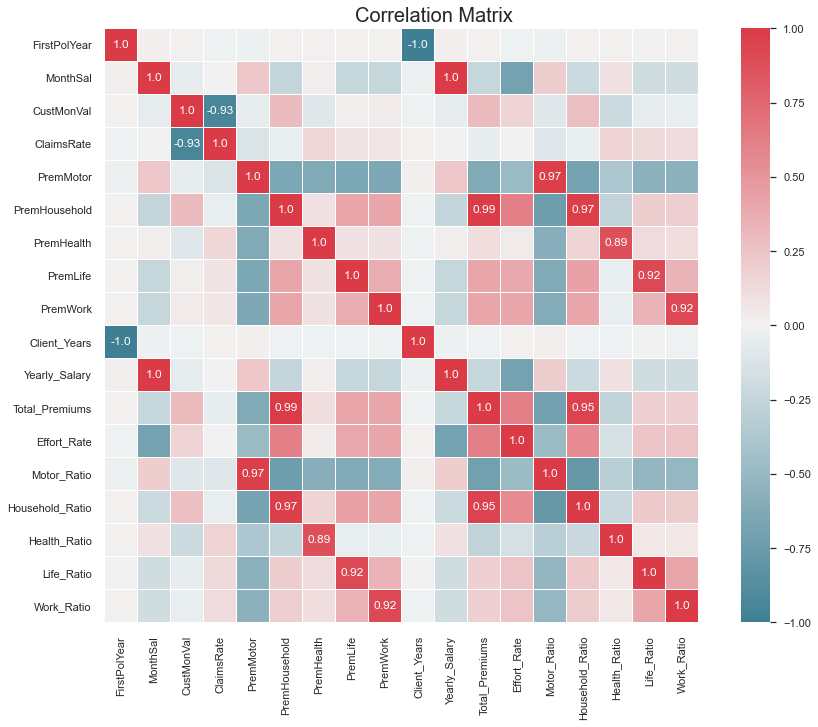

In [73]:
#Correlation Matrix
corr = np.round(df_metric_features.corr(method="pearson"), decimals=2)
cor_heatmap(corr)

In [74]:
#Backup dataframe
df_backup1 = data.copy()

### 4.6.2) Categorical Features <a name="FSCategoricalFeatures"></a>

**Remove the variables that for one category have more than 90% of the observations**

In [75]:
to_drop=[]
for feature in non_metric_features:
    for proportion in data[feature].value_counts()/len(data):
        if proportion > 0.90:
            to_drop.append(feature)
            break
            
if to_drop != []:
    print('The non-metric features that have more than 90% in one of their categories/unique values (to be dropped because \
    of their relevancy) are the following:\n',to_drop)
    #Remove the variables that for one category have more than 90% of the observations
    data.drop(columns=to_drop, inplace=True)
    #Updating non metric features list:
    non_metric_features = update_metric_feat(data)[1]   
else:
    print('There are no non-metric features that have more than 90% in one of their categories.')

There are no non-metric features that have more than 90% in one of their categories.


**Remove the categorical features with high variability (none of the categories have more than 10% of the observations)**

In [76]:
to_drop=[]
for feature in non_metric_features:
    aux =[]
    for proportion in data[feature].value_counts()/len(data):
        if proportion < 0.10:
            aux.append(proportion)
    if len(aux)==len(data[feature].value_counts()): # if all categories have less than 10%;
        to_drop.append(feature)

if to_drop != []:
    print('The non-metric features that have less than 10% in all of their categories/unique values (to be dropped because \
    of their relevancy) are the following:\n',to_drop)
    #Remove the variables that for one category have more than 90% of the observations
    data.drop(columns=to_drop, inplace=True)
    #Updating non metric features list:
    non_metric_features = update_metric_feat(data)[1]
else:
    print('There are no non-metric features with high variability.')


There are no non-metric features with high variability.


**Compare Categories of GeoLivArea**

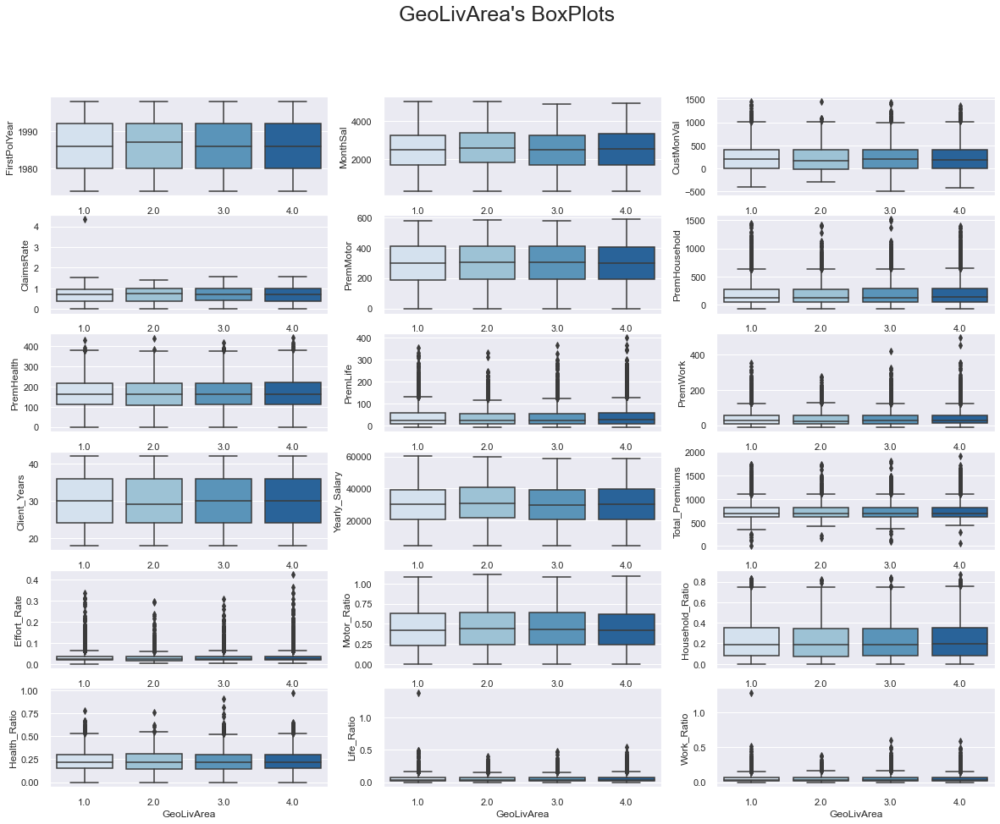

In [77]:
#All Numeric Variables' Box Plots in one figure
sns.set()

#Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(6,3, figsize=(20, 15))

#Plot data
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=data["GeoLivArea"], y=data[feat], ax=ax, palette="Blues")
    
#Layout
title = "GeoLivArea's BoxPlots"

plt.suptitle(title, fontsize=25)

plt.show()

As it can be seen in the boxplots there are no significant differences between categories of GeoLivArea in the other variables. Therefore, we conclude that this variable is not important and we will remove it.

In [78]:
#Removing the variable GeoLivArea
data = data.drop(columns='GeoLivArea', axis=1)

**Compare Categories of EducDeg**

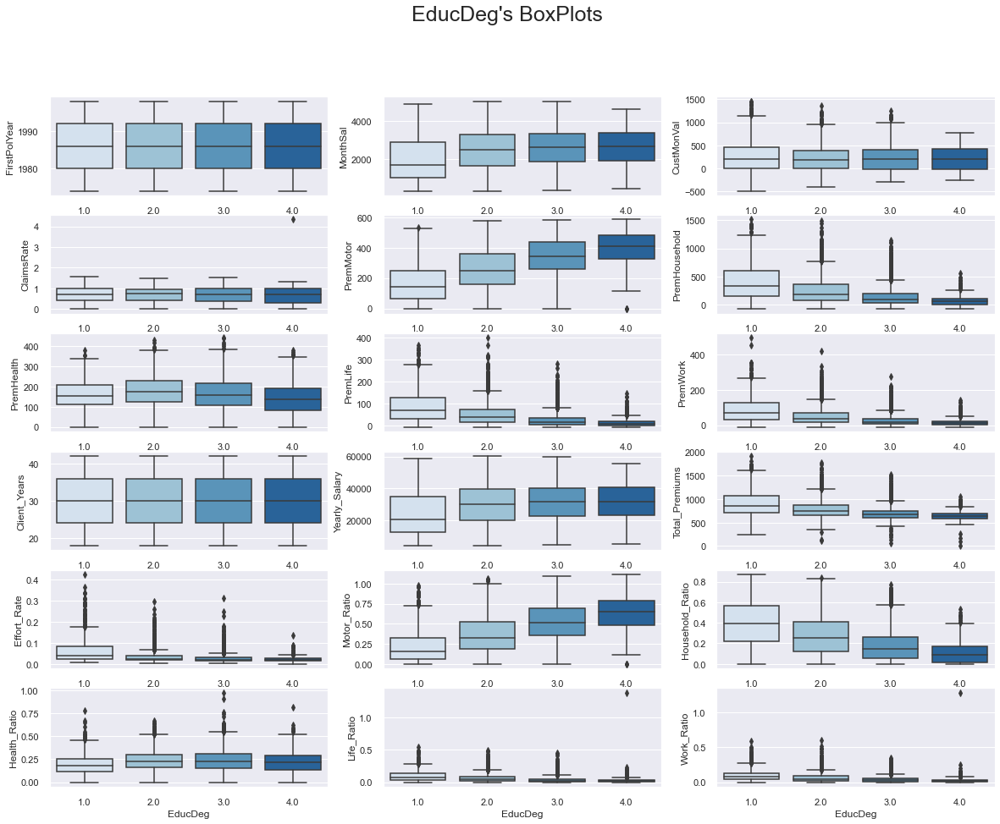

In [79]:
#All Numeric Variables' Box Plots in one figure
sns.set()

#Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(6,3, figsize=(20, 15))

#Plot data
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=data["EducDeg"], y=data[feat], ax=ax, palette="Blues")
    
#Layout
title = "EducDeg's BoxPlots"

plt.suptitle(title, fontsize=25)

plt.show()

**Compare Categories of Children**

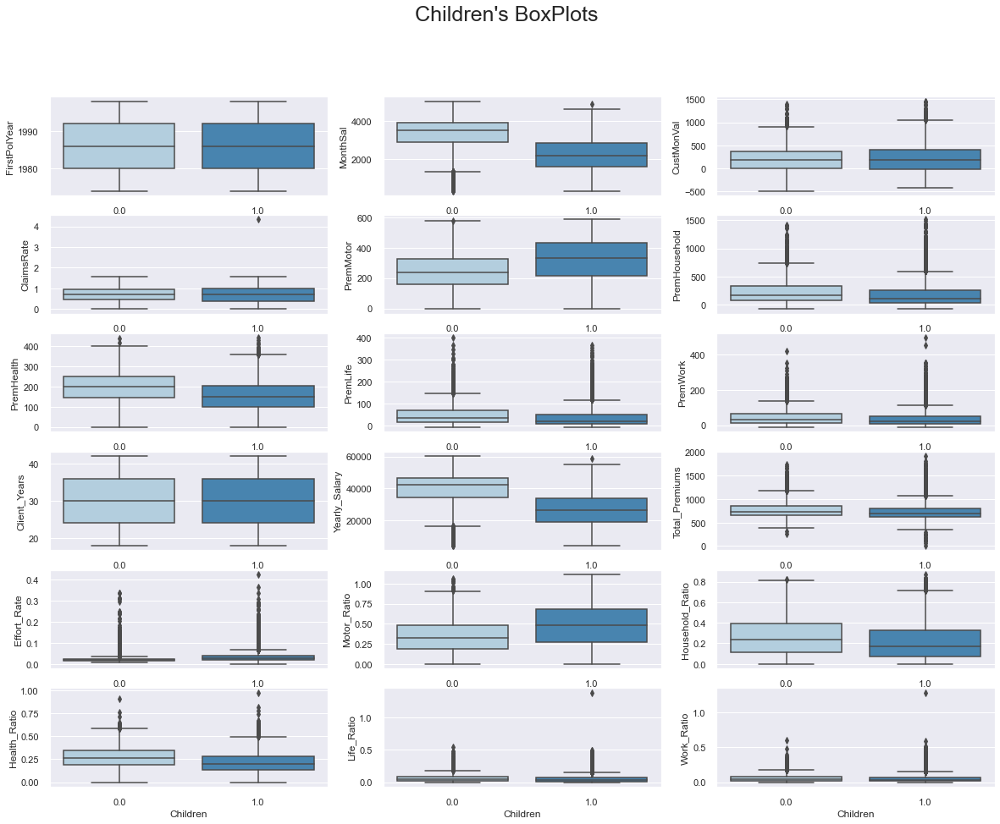

In [80]:
#All Numeric Variables' Box Plots in one figure
sns.set()

#Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(6,3, figsize=(20, 15))

#Plot data
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=data["Children"], y=data[feat], ax=ax, palette="Blues")
    
#Layout
title = "Children's BoxPlots"

plt.suptitle(title, fontsize=25)

plt.show()

**Compare Categories of Profit**

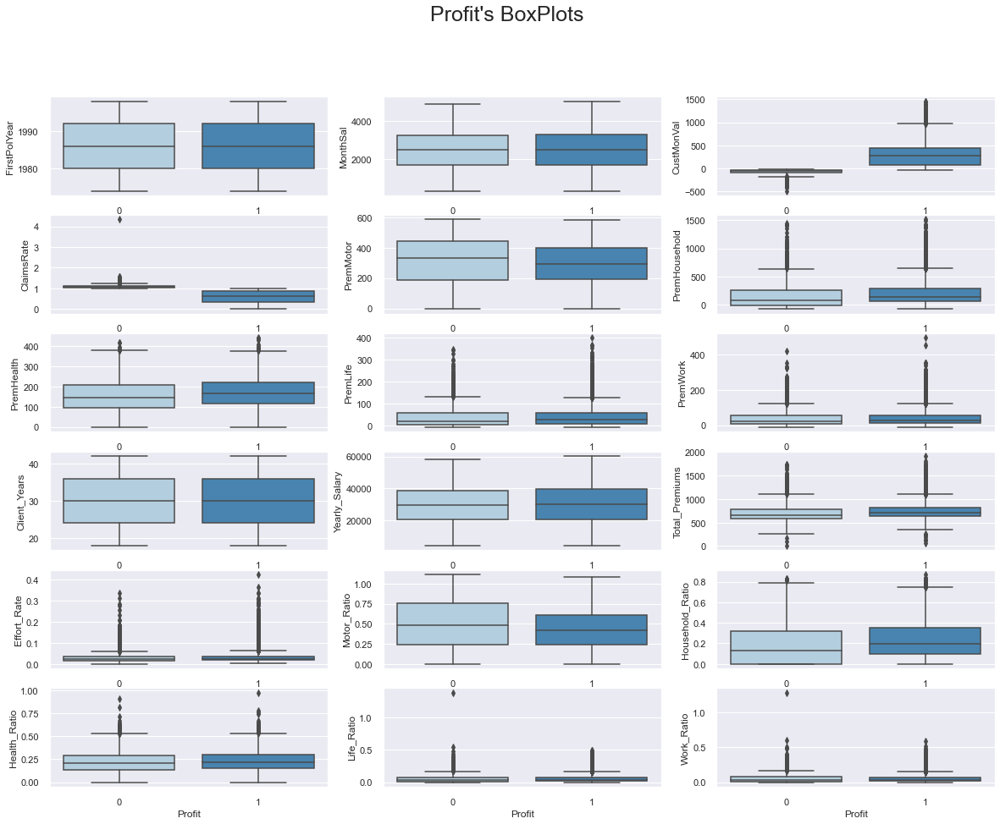

In [81]:
#All Numeric Variables' Box Plots in one figure
sns.set()

#Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(6,3, figsize=(20, 15))

#Plot data
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=data["Profit"], y=data[feat], ax=ax, palette="Blues")
    
#Layout
title = "Profit's BoxPlots"

plt.suptitle(title, fontsize=25)

plt.show()

**Compare Categories of Cancelled**

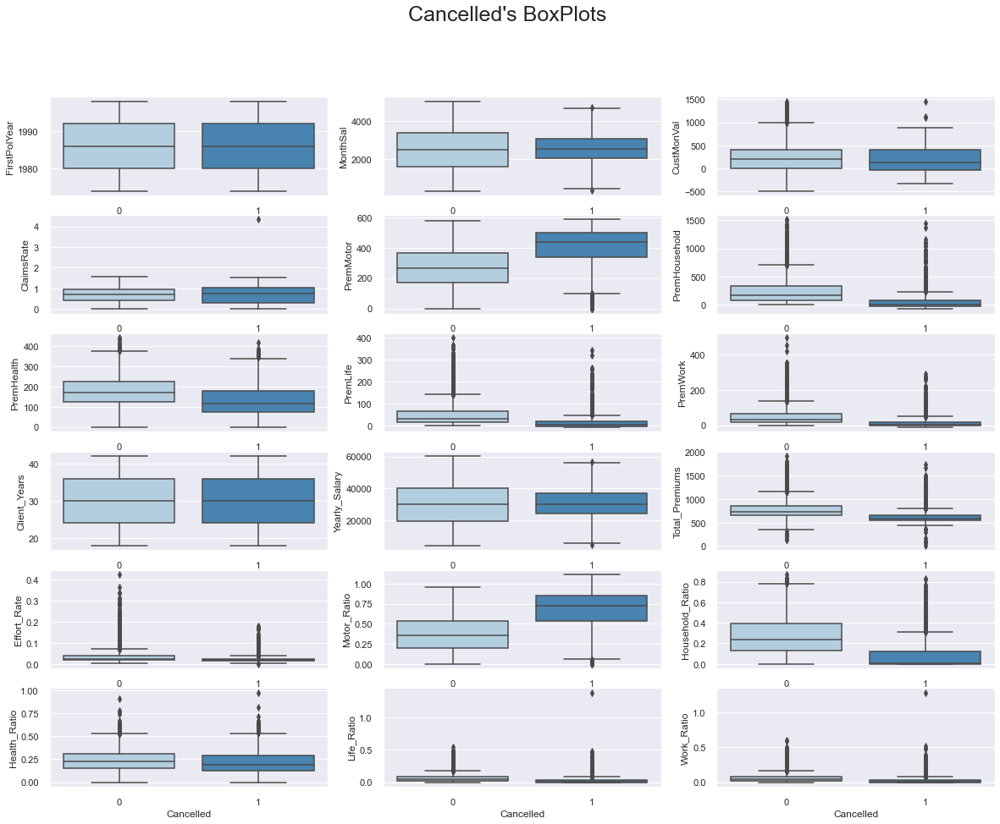

In [82]:
#All Numeric Variables' Box Plots in one figure
sns.set()

#Prepare figure. Create individual axes where each box plot will be placed
fig, axes = plt.subplots(6,3, figsize=(20, 15))

#Plot data
for ax, feat in zip(axes.flatten(), metric_features):
    sns.boxplot(x=data["Cancelled"], y=data[feat], ax=ax, palette="Blues")
    
#Layout
title = "Cancelled's BoxPlots"

plt.suptitle(title, fontsize=25)

plt.show()

Contrary to what happens with GeoLivArea, the different categories of the variables EducDeg, Children, Cancelled and Profit have impact on (at least some of) the other variables.

In [83]:
#Updating metric_features and non_metric_features
metric_features = update_metric_feat(data)[0]
non_metric_features = update_metric_feat(data)[1]

## 4.7) Data Normalization <a name="DataNormalization"></a>

In [84]:
#Creating a scaled dataframe
data_scaled = data.copy()
scaler = StandardScaler()
scaled_feat = scaler.fit_transform(data_scaled[metric_features])
data_scaled[metric_features] = pd.DataFrame(scaled_feat, index=data_scaled[metric_features].index, columns=data_scaled[metric_features].columns)

In [85]:
#Updating df_metric_features and df_non_metric_features
df_metric_features = data[metric_features]
df_non_metric_features = data[non_metric_features]

# 5) Clustering <a name="Clustering"></a>

In [86]:
#Selecting the features for the value perspective
value_features = [
    'CustMonVal', 'Effort_Rate', 'Total_Premiums', 'Cancelled', 'Profit'
]

In [87]:
#Selecting the features for the consumption perspective
consumption_features = [
    'Motor_Ratio','Household_Ratio','Health_Ratio','Life_Ratio','Work_Ratio'
]

In [88]:
#Return sum of sum of squares of each df variable
def get_ss(df):
    """Computes the sum of squares for all variables given a dataset
    """
    ss = np.sum(df.var() * (df.count() - 1))
    return ss 

In [89]:
#Defining metric and categorical features for the value perspective
value_metric_features = ['CustMonVal', 'Effort_Rate', 'Total_Premiums']
value_non_metric_features = ['Cancelled', 'Profit']

In [90]:
#Defining metric and categorical features
metric_features = ['FirstPolYear',
 'MonthSal',
 'CustMonVal',
 'ClaimsRate',
 'PremMotor',
 'PremHousehold',
 'PremHealth',
 'PremLife',
 'PremWork',
 'Client_Years',
 'Yearly_Salary',
 'Total_Premiums',
 'Effort_Rate',
 'Motor_Ratio',
 'Household_Ratio',
 'Health_Ratio',
 'Life_Ratio',
 'Work_Ratio']

non_metric_features = ['EducDeg', 'Children', 'Profit', 'Cancelled']

In [91]:
#Backup dataframe
backup = data_scaled.copy()

## 5.1) DBSCAN <a name="DBSCAN"></a>

### 5.1.1) Value Perspective <a name="DBSCANvalue"></a>

In [92]:
#Creating a new dataframe for the DBSCAN
data_dbscan = data_scaled.copy()

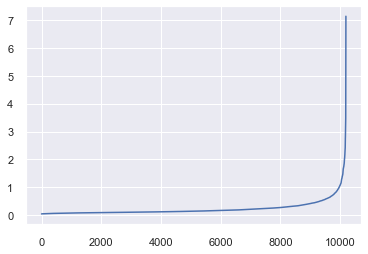

In [93]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(data_dbscan[value_metric_features])
distances, _ = neigh.kneighbors(data_dbscan[value_metric_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [94]:
# Performing DBSCAN clustering
dbscan = DBSCAN(eps=0.75, min_samples=6, n_jobs=4)
dbscan_labels = dbscan.fit_predict(data_dbscan[value_metric_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 2


In [95]:
# Concatenating the labels to df
df_concat = pd.concat([data_dbscan[value_metric_features], pd.Series(dbscan_labels, index=data_dbscan.index, name="Value")], axis=1)
df_concat.head()

,CustMonVal,Effort_Rate,Total_Premiums,Value
CustID,,,,
1.0,0.649847,-0.256281,-0.451999,0
2.0,-1.375382,2.686406,0.875602,0
3.0,1.139050,-0.201016,-0.046036,0
4.0,-0.923986,0.425286,-0.802996,0
5.0,-0.717469,-0.111417,-0.648488,0


In [96]:
# Detecting noise (potential outliers)
df_out_value = df_concat.loc[df_concat['Value'] == -1]

In [97]:
# Computing the R^2 of the cluster solution
df_nonoise = df_concat.loc[df_concat['Value'] != -1]
sst = get_ss(data_dbscan[value_metric_features])  # get total sum of squares
ssw_labels = get_ss(df_nonoise.groupby(by='Value'))  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.1921


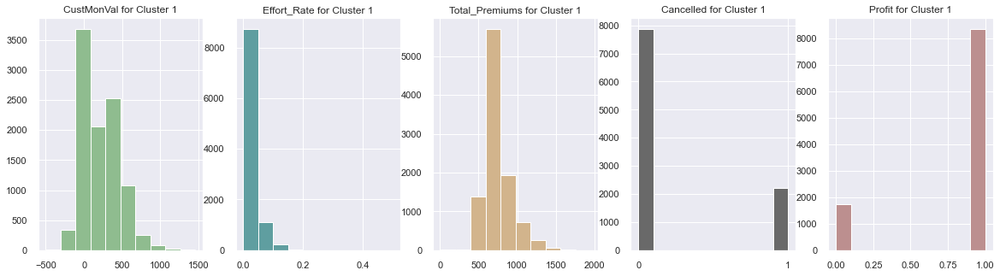

In [98]:
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(20,5))

# cluster 1
axs[0].hist(data['CustMonVal'].loc[df_concat['Value']==0], color='darkseagreen', range=[-500,1460])
axs[0].set_title('CustMonVal for Cluster 1')
axs[1].hist(data['Effort_Rate'].loc[df_concat['Value']==0], color='cadetblue', range=[0,0.5])
axs[1].set_title('Effort_Rate for Cluster 1')
axs[2].hist(data['Total_Premiums'].loc[df_concat['Value']==0], color='tan', range=[9,1950])
axs[2].set_title('Total_Premiums for Cluster 1')
axs[3].hist(data['Cancelled'].loc[df_concat['Value']==0], color='dimgrey', range=[0,1])
axs[3].set_title('Cancelled for Cluster 1')
plt.sca(axs[3])
plt.xticks([0, 1])
axs[4].hist(data['Profit'].loc[df_concat['Value']==0], color='rosybrown', range=[0,1])
axs[4].set_title('Profit for Cluster 1')

                                   
plt.show()


In [99]:
#Number of observations in each cluster
df_concat['Value'].value_counts()

 0    10085
-1      109
Name: Value, dtype: int64

### 5.1.2) Consumption Perspective <a name="DBSCANcons"></a>

In [100]:
#Creating a new dataframe for the DBSCAN
data_dbscan_cons = data_scaled.copy()

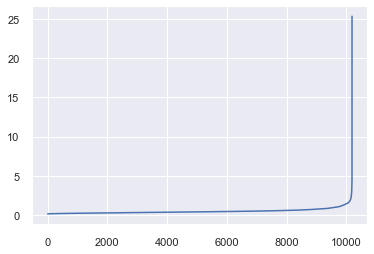

In [101]:
# K-distance graph to find out the right eps value
neigh = NearestNeighbors(n_neighbors=20)
neigh.fit(data_dbscan_cons[consumption_features])
distances, _ = neigh.kneighbors(data_dbscan_cons[consumption_features])
distances = np.sort(distances[:, -1])
plt.plot(distances)
plt.show()

In [102]:
# Performing DBSCAN clustering
dbscan = DBSCAN(eps=1.5, min_samples=10, n_jobs=4)
dbscan_labels = dbscan.fit_predict(data_dbscan_cons[consumption_features])

dbscan_n_clusters = len(np.unique(dbscan_labels))
print("Number of estimated clusters : %d" % dbscan_n_clusters)

Number of estimated clusters : 2


In [103]:
# Concatenating the labels to df
df_concat = pd.concat([data_dbscan_cons[consumption_features], pd.Series(dbscan_labels, index=data_dbscan.index, name="Consumption")], axis=1)
df_concat.head()

,Motor_Ratio,Household_Ratio,Health_Ratio,Life_Ratio,Work_Ratio,Consumption
CustID,,,,,,
1.0,0.495554,-0.588453,-0.101613,0.302801,-0.464282,0
2.0,-1.422993,1.208973,-0.931484,2.735977,1.115959,0
3.0,-0.649768,0.390174,-0.568843,1.085645,1.414209,0
4.0,-0.548043,-0.839848,2.593153,0.101838,-0.086197,0
5.0,0.389279,-0.819629,0.533566,-0.391890,0.237967,0


In [104]:
# Detecting noise (potential outliers)
df_out_cons = df_concat.loc[df_concat['Consumption'] == -1]

In [105]:
# Computing the R^2 of the cluster solution
df_nonoise = df_concat.loc[df_concat['Consumption'] != -1]
sst = get_ss(data_dbscan_cons[consumption_features])  # get total sum of squares
ssw_labels = get_ss(df_nonoise.groupby(by='Consumption'))  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels) 
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.0523


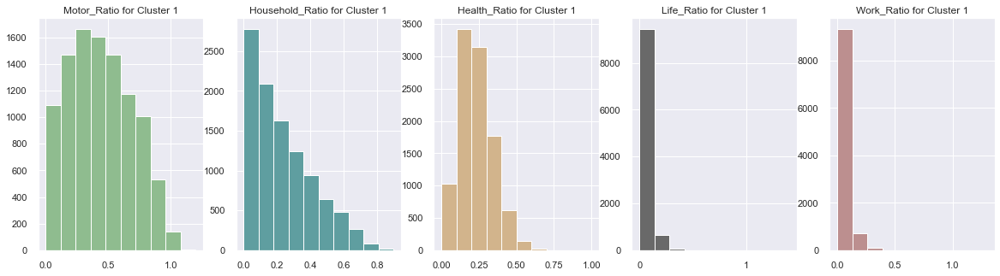

In [106]:
fig, axs = plt.subplots(nrows=1, ncols=5, figsize=(20,5))

# cluster 1
axs[0].hist(data['Motor_Ratio'].loc[df_concat['Consumption']==0], color='darkseagreen', range=[0,1.2])
axs[0].set_title('Motor_Ratio for Cluster 1')
axs[1].hist(data['Household_Ratio'].loc[df_concat['Consumption']==0], color='cadetblue', range=[0,0.9])
axs[1].set_title('Household_Ratio for Cluster 1')
axs[2].hist(data['Health_Ratio'].loc[df_concat['Consumption']==0], color='tan', range=[0,1])
axs[2].set_title('Health_Ratio for Cluster 1')
axs[3].hist(data['Life_Ratio'].loc[df_concat['Consumption']==0], color='dimgrey', range=[0,1.40])
axs[3].set_title('Life_Ratio for Cluster 1')
plt.sca(axs[3])
plt.xticks([0, 1])
axs[4].hist(data['Work_Ratio'].loc[df_concat['Consumption']==0], color='rosybrown', range=[0,1.3])
axs[4].set_title('Work_Ratio for Cluster 1')


plt.show()


In [ ]:
#Number of observations in each cluster
df_concat['Consumption'].value_counts()

In [107]:
out_cons = list(df_out_cons.index)

In [108]:
out_value = list(df_out_value.index)

In [109]:
#List with the index of the rows that are outliers
out = list(set(out_cons + out_value))

In [110]:
#Dataframe with outliers
data_with_outliers = data.copy()
data_scaled_with_outliers = data_scaled.copy()

In [111]:
#Creating dataframes without outliers
data = data[~data.index.isin(out)]
data_scaled = data_scaled[~data_scaled.index.isin(out)]

## 5.2) K - Prototypes + Hierarchical Clustering (Value) <a name="kprot"></a>

In [112]:
#Creating a new dataframe to perform the K-Prototypes algorithm
kproto = data_scaled[value_features]
kproto.reset_index(drop=False, inplace=True)

In [113]:
#Starting with 15 clusters
kp = KP(n_clusters=15, init='Huang', verbose=2)
clusters = kp.fit_predict(kproto[value_features], categorical=[3,4])

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 3996, ncost: 5142.397181762742
Run: 1, iteration: 2/100, moves: 1410, ncost: 4775.6942363108055
Run: 1, iteration: 3/100, moves: 754, ncost: 4682.244248635316
Run: 1, iteration: 4/100, moves: 407, ncost: 4656.789967664013
Run: 1, iteration: 5/100, moves: 220, ncost: 4649.551348739307
Run: 1, iteration: 6/100, moves: 175, ncost: 4644.002813805235
Run: 1, iteration: 7/100, moves: 125, ncost: 4639.9819937512975
Run: 1, iteration: 8/100, moves: 97, ncost: 4635.7934658063805
Run: 1, iteration: 9/100, moves: 80, ncost: 4631.91804395024
Run: 1, iteration: 10/100, moves: 78, ncost: 4626.065909823158
Run: 1, iteration: 11/100, moves: 79, ncost: 4617.637139188523
Run: 1, iteration: 12/100, moves: 54, ncost: 4612.5322014051335
Run: 1, iteration: 13/100, moves: 31, ncost: 4609.84914717437
Run: 1, iteration: 14/100, moves: 24, ncost: 4608.816927763809
Run: 1, iteration: 15/100, moves: 11

Run: 4, iteration: 14/100, moves: 106, ncost: 4350.975568582069
Run: 4, iteration: 15/100, moves: 59, ncost: 4349.375029192384
Run: 4, iteration: 16/100, moves: 40, ncost: 4348.574095826005
Run: 4, iteration: 17/100, moves: 42, ncost: 4347.926451437326
Run: 4, iteration: 18/100, moves: 36, ncost: 4347.299397036047
Run: 4, iteration: 19/100, moves: 33, ncost: 4346.850774481802
Run: 4, iteration: 20/100, moves: 44, ncost: 4346.109171220845
Run: 4, iteration: 21/100, moves: 58, ncost: 4344.95374899291
Run: 4, iteration: 22/100, moves: 62, ncost: 4342.983705804455
Run: 4, iteration: 23/100, moves: 58, ncost: 4341.520250647566
Run: 4, iteration: 24/100, moves: 60, ncost: 4340.4367169745055
Run: 4, iteration: 25/100, moves: 49, ncost: 4339.838659249551
Run: 4, iteration: 26/100, moves: 27, ncost: 4339.671118879743
Run: 4, iteration: 27/100, moves: 13, ncost: 4339.600533814698
Run: 4, iteration: 28/100, moves: 6, ncost: 4339.570594379428
Run: 4, iteration: 29/100, moves: 3, ncost: 4339.564045

Run: 7, iteration: 48/100, moves: 45, ncost: 4502.349334799455
Run: 7, iteration: 49/100, moves: 42, ncost: 4501.9904382541645
Run: 7, iteration: 50/100, moves: 28, ncost: 4501.869288499367
Run: 7, iteration: 51/100, moves: 11, ncost: 4501.813905606968
Run: 7, iteration: 52/100, moves: 10, ncost: 4501.786975170362
Run: 7, iteration: 53/100, moves: 3, ncost: 4501.7833605416245
Run: 7, iteration: 54/100, moves: 3, ncost: 4501.780085628664
Run: 7, iteration: 55/100, moves: 1, ncost: 4501.778818847555
Run: 7, iteration: 56/100, moves: 0, ncost: 4501.778818847555
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 8, iteration: 1/100, moves: 3742, ncost: 4947.827965549987
Run: 8, iteration: 2/100, moves: 1345, ncost: 4773.246529022912
Run: 8, iteration: 3/100, moves: 784, ncost: 4721.40427154526
Run: 8, iteration: 4/100, moves: 484, ncost: 4694.129315492472
Run: 8, iteration: 5/100, moves: 424, ncost: 4669.457904850756
Run: 8, iteration: 6/100, moves: 363, n

In [114]:
centro = kp.cluster_centroids_
kproto['Label'] = kp.labels_
kproto.Label = kproto.Label.apply(pd.to_numeric)

In [115]:
centroids = pd.DataFrame()
centroids['CustMonVal']=pd.DataFrame(centro[0]).loc[:,0]
centroids['Effort_Rate']=pd.DataFrame(centro[1]).loc[:,0]
centroids['Total_Premiums']=pd.DataFrame(centro[2]).loc[:,0]
centroids['Cancelled']=pd.DataFrame(centro[3]).loc[:,0]
centroids['Profit']=pd.DataFrame(centro[4]).loc[:,0]

In [116]:
del centro, kp, clusters

In [117]:
Z = linkage(centroids, method = "ward")

In [118]:
hierarchy.set_link_color_palette(['darkseagreen','cadetblue', 'seagreen', 'mediumseagreen', 'c','mediumturquoise','turquoise'])

(0.0, 50.0, 0.0, 4.819078999799341)

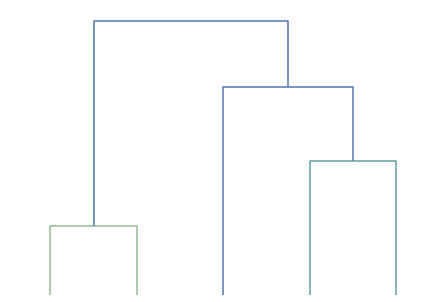

In [119]:
#Checking the Dendrogram
fig = plt.figure(figsize=(10,20))
ax2 = fig.add_axes([0.3, 0.71, 0.6, 0.2])
Z = hierarchy.linkage(centroids, method='ward')

dendrogram(Z,
          truncate_mode="lastp",
          p=40,
          orientation ="top" ,
          leaf_rotation=45.,
          leaf_font_size=10.,
          show_contracted=True,
          show_leaf_counts=True)
cur_axes = plt.gca()
plt.xlabel('Cluster Size')
plt.ylabel('Distance')

ax2.set_yticks([])
ax2.axis('off')

In [121]:
#Running K-Prototypes with 3 clusters observed in the Dendrogram
kp = KP(n_clusters=3, init='Huang', verbose=2)
clusters = kp.fit_predict(kproto[value_features], categorical=[3,4])

Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 1, iteration: 1/100, moves: 3257, ncost: 13328.40328802797
Run: 1, iteration: 2/100, moves: 1378, ncost: 12865.681863345833
Run: 1, iteration: 3/100, moves: 351, ncost: 12829.442501257863
Run: 1, iteration: 4/100, moves: 119, ncost: 12825.25134289058
Run: 1, iteration: 5/100, moves: 37, ncost: 12824.853347943306
Run: 1, iteration: 6/100, moves: 19, ncost: 12824.763527933195
Run: 1, iteration: 7/100, moves: 8, ncost: 12824.729137086622
Run: 1, iteration: 8/100, moves: 2, ncost: 12824.727008504962
Run: 1, iteration: 9/100, moves: 0, ncost: 12824.727008504962
Init: initializing centroids
Init: initializing clusters
Starting iterations...
Run: 2, iteration: 1/100, moves: 3704, ncost: 13793.153697765745
Run: 2, iteration: 2/100, moves: 1576, ncost: 12976.305979995852
Run: 2, iteration: 3/100, moves: 494, ncost: 12846.790965889359
Run: 2, iteration: 4/100, moves: 147, ncost: 12827.925888605889
Run: 2, iterat

In [122]:
centro = kp.cluster_centroids_
kproto['Label'] = kp.labels_
kproto.Label = kproto.Label.apply(pd.to_numeric)

In [123]:
centroids = pd.DataFrame()
centroids['Cluster0']=pd.DataFrame(centro[0]).loc[:,0]
centroids['Cluster1']=pd.DataFrame(centro[1]).loc[:,0]
centroids['Cluster2']=pd.DataFrame(centro[2]).loc[:,0]
#centroids['Cancelled']=pd.DataFrame(centro[3]).loc[:,0]
#centroids['Profit']=pd.DataFrame(centro[4]).loc[:,0]

In [124]:
del centro, kp, clusters

In [125]:
Hclustering = AgglomerativeClustering(n_clusters=3, affinity="euclidean", linkage="ward")
HC = Hclustering.fit(centroids)

In [126]:
labels = pd.DataFrame(HC.labels_)
labels.columns =  ['Value']

In [127]:
centroids = pd.concat([centroids, labels], axis = 1)
centroids['Label']=[i for i in range(0,5)]

In [128]:
j=0
for i in range(0, len(centroids['Value'])):
    kproto['Label']=kproto['Label'].replace(centroids['Label'][i], centroids['Value'][j])
    j+=1

In [129]:
kproto.set_index('CustID', inplace=True)

In [130]:
data_kproto = pd.concat([data_scaled, kproto['Label']], axis=1)
data_kproto.rename(columns={"Label": "Value"}, inplace=True)

In [131]:
del Z, fig, ax2, centroids, cur_axes, Hclustering, labels, kproto

In [132]:
data_kproto.describe()

,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,PremMotor,PremHousehold,PremHealth,PremLife,PremWork,Client_Years,Yearly_Salary,Total_Premiums,Effort_Rate,Motor_Ratio,Household_Ratio,Health_Ratio,Life_Ratio,Work_Ratio,Value
count,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000,10055.000000
mean,0.001698,0.023508,-0.005053,-0.002929,0.022978,-0.029007,0.006386,-0.023587,-0.022228,-0.001698,0.023508,-0.027289,-0.062592,0.020425,-0.020883,0.009363,-0.021582,-0.018683,0.874391
std,0.999076,0.983320,0.978651,0.989238,0.986464,0.945738,1.000229,0.957910,0.958782,0.999076,0.983320,0.943065,0.772558,0.990976,0.976591,0.989491,0.928060,0.939520,0.331425
min,-1.819053,-2.199085,-2.462702,-2.132405,-2.181345,-1.229885,-2.274026,-1.020299,-1.123060,-1.815250,-2.199085,-3.405181,-1.007022,-1.763087,-1.224186,-2.089348,-0.900227,-0.904353,0.000000
25%,-0.910477,-0.774572,-0.887959,-0.911840,-0.724352,-0.680179,-0.746172,-0.666291,-0.655441,-0.906674,-0.774572,-0.666016,-0.519130,-0.785313,-0.808388,-0.743738,-0.664350,-0.650697,1.000000
50%,-0.001901,0.023826,-0.114013,0.120946,0.037102,-0.315262,-0.061170,-0.352156,-0.325396,0.001901,0.023826,-0.291486,-0.341566,-0.044158,-0.224523,-0.107989,-0.309937,-0.300804,1.000000
75%,0.906674,0.813584,0.716228,0.934657,0.810638,0.347802,0.701283,0.309024,0.303721,0.910477,0.813584,0.366851,0.064428,0.765291,0.611726,0.639104,0.313131,0.316192,1.000000
max,1.815250,2.565892,4.870796,2.687263,2.082695,5.155175,3.688519,6.831593,6.677983,1.819053,2.565892,4.973476,5.100485,2.707577,3.418705,4.808867,6.517571,7.181410,1.000000


In [133]:
data_kproto['Value'].value_counts()

1    8792
0    1263
Name: Value, dtype: int64

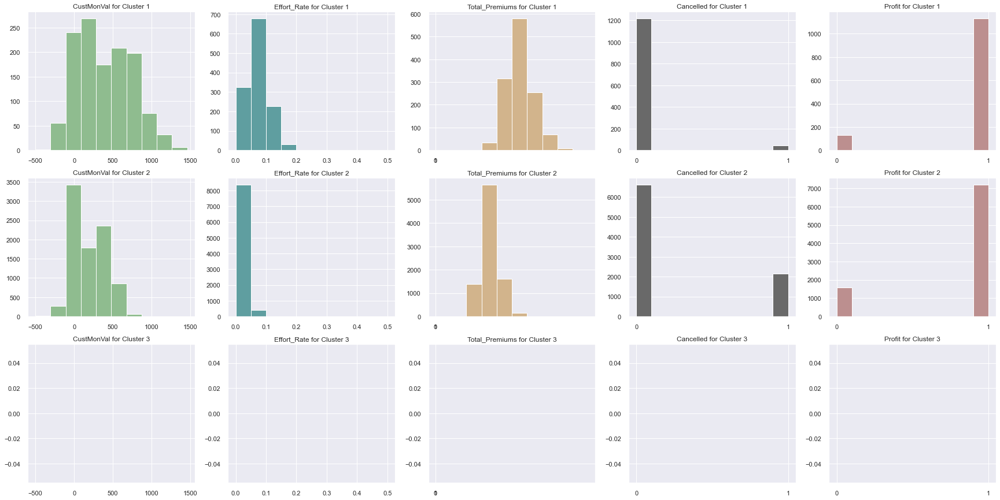

In [134]:
fig, axs = plt.subplots(3, 5, figsize=(30,15))

# cluster 1
axs[0, 0].hist(data['CustMonVal'].loc[data_kproto['Value']==0], color='darkseagreen', range=[-500,1460])
axs[0, 0].set_title('CustMonVal for Cluster 1')
plt.sca(axs[0, 1])
axs[0, 1].hist(data['Effort_Rate'].loc[data_kproto['Value']==0], color='cadetblue', range=[0,0.5])
axs[0, 1].set_title('Effort_Rate for Cluster 1')
plt.sca(axs[0, 1])
axs[0, 2].hist(data['Total_Premiums'].loc[data_kproto['Value']==0], color='tan', range=[9,1950])
axs[0, 2].set_title('Total_Premiums for Cluster 1')
plt.sca(axs[0, 2])
plt.xticks([0, 1])
axs[0, 3].hist(data['Cancelled'].loc[data_kproto['Value']==0], color='dimgrey', range =[0,1])
axs[0, 3].set_title('Cancelled for Cluster 1')
plt.sca(axs[0, 3])
plt.xticks([0, 1])
axs[0, 4].hist(data['Profit'].loc[data_kproto['Value']==0], color='rosybrown', range =[0,1])
axs[0, 4].set_title('Profit for Cluster 1')
plt.sca(axs[0, 4])
plt.xticks([0, 1])

# cluster 2
axs[1, 0].hist(data['CustMonVal'].loc[data_kproto['Value']==1], color='darkseagreen', range=[-500,1460])
axs[1, 0].set_title('CustMonVal for Cluster 2')
axs[1, 1].hist(data['Effort_Rate'].loc[data_kproto['Value']==1], color='cadetblue', range=[0, 0.5])
axs[1, 1].set_title('Effort_Rate for Cluster 2')
axs[1, 2].hist(data['Total_Premiums'].loc[data_kproto['Value']==1], color='tan', range=[9,1950])
axs[1, 2].set_title('Total_Premiums for Cluster 2')
plt.sca(axs[1, 2])
plt.xticks([0, 1])
axs[1, 3].hist(data['Cancelled'].loc[data_kproto['Value']==1], color='dimgrey', range =[0,1])
axs[1, 3].set_title('Cancelled for Cluster 2')
plt.sca(axs[1, 3])
plt.xticks([0, 1])
axs[1, 4].hist(data['Profit'].loc[data_kproto['Value']==1], color='rosybrown', range =[0,1])
axs[1, 4].set_title('Profit for Cluster 2')
plt.sca(axs[1, 4])
plt.xticks([0, 1])

# cluster 3
axs[2, 0].hist(data['CustMonVal'].loc[data_kproto['Value']==2], color='darkseagreen', range=[-500,1460])
axs[2, 0].set_title('CustMonVal for Cluster 3')
axs[2, 1].hist(data['Effort_Rate'].loc[data_kproto['Value']==2], color='cadetblue', range=[0,0.5])
axs[2, 1].set_title('Effort_Rate for Cluster 3')
axs[2, 2].hist(data['Total_Premiums'].loc[data_kproto['Value']==2], color='tan', range=[9,1950])
axs[2, 2].set_title('Total_Premiums for Cluster 3')
plt.sca(axs[2, 2])
plt.xticks([0, 1])
axs[2, 3].hist(data['Cancelled'].loc[data_kproto['Value']==2], color='dimgrey', range =[0,1])
axs[2, 3].set_title('Cancelled for Cluster 3')
plt.sca(axs[2, 3])
plt.xticks([0, 1])
axs[2, 4].hist(data['Profit'].loc[data_kproto['Value']==2], color='rosybrown', range =[0,1])
axs[2, 4].set_title('Profit for Cluster 3')
plt.sca(axs[2, 4])
plt.xticks([0, 1])

plt.show()

In [135]:
#Number of observations in each cluster
data_kproto['Value'].value_counts()

1    8792
0    1263
Name: Value, dtype: int64

## 5.3) K - means + Hierarchical Clustering <a name="KMH"></a>

### 5.3.1) Value Perspective <a name="KMHvalue"></a>

In [136]:
value_df = data[value_features]

In [137]:
scaler = StandardScaler()
value_df_scaled = scaler.fit_transform(value_df[value_metric_features])
value_df_scaled = pd.DataFrame(value_df_scaled, index= data_scaled.index, columns = value_metric_features)

In [138]:
value_df_scaled

,CustMonVal,Effort_Rate,Total_Premiums
CustID,,,
1.0,0.669220,-0.250724,-0.450373
2.0,-1.400293,3.558484,0.957448
3.0,1.169120,-0.179185,-0.019880
4.0,-0.939027,0.631542,-0.822580
5.0,-0.727994,-0.063202,-0.658735
...,...,...,...
10291.0,-0.158060,6.253006,3.205373
10292.0,-0.870811,-0.633459,-0.588057
10294.0,1.247641,-0.496604,-0.274367


In [139]:
#Starting with 20 clusters
kmeans = KMeans(n_clusters=20, random_state=0, n_init = 5, max_iter = 200).fit(value_df_scaled)

In [140]:
clusters = kmeans.cluster_centers_

In [141]:
# save the centroids inverting the normalization
clusters = pd.DataFrame(scaler.inverse_transform(X = clusters),columns = value_metric_features)

In [142]:
#Getting the Silhoutte score
silhouette_avg = silhouette_score(value_df_scaled, kmeans.labels_)
sample_silhouette_values = silhouette_samples(value_df_scaled, kmeans.labels_)

In [143]:
del silhouette_avg, sample_silhouette_values#, cluster_labels

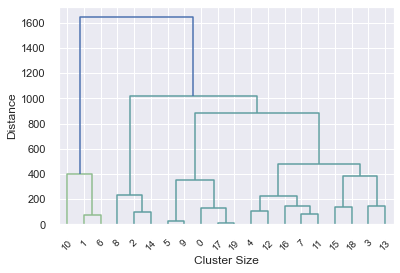

In [144]:
#Checking the Dendrogram
Z = linkage(clusters, method = "ward")

hierarchy.set_link_color_palette(['darkseagreen','cadetblue', 'seagreen', 'mediumseagreen', 'c','mediumturquoise','turquoise'])

#fig = plt.figure(figsize=(10, 20))
#ax2 = fig.add_axes([0.3, 0.71, 0.6, 0.2])
#Z = hierarchy.linkage(clusters, method='ward')

dendrogram(Z,
          truncate_mode="lastp",
          p=40,
          orientation ="top" ,
          leaf_rotation=45.,
          leaf_font_size=10.,
          show_contracted=True,
          show_leaf_counts=True)

#cur_axes = plt.gca()
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()

In [145]:
#Running K-Means with 4 clusters observed on the Dendrogram
kmeans = KMeans(n_clusters=4, random_state=0, n_init = 5, max_iter = 200).fit(value_df_scaled)

In [146]:
clusters = kmeans.cluster_centers_

In [147]:
# save the centroids inverting the normalization
clusters = pd.DataFrame(scaler.inverse_transform(X = clusters),columns = value_metric_features)

In [148]:
silhouette_avg = silhouette_score(value_df_scaled, kmeans.labels_)
sample_silhouette_values = silhouette_samples(value_df_scaled, kmeans.labels_)

In [149]:
cluster_labels = pd.DataFrame(kmeans.labels_ , index= data_scaled.index)
cluster_labels.columns=['Labels']

In [150]:
value_df = pd.concat([value_df, cluster_labels], axis = 1)

In [151]:
del silhouette_avg, sample_silhouette_values, cluster_labels

In [152]:
Hclustering = AgglomerativeClustering(n_clusters=4, affinity="euclidean", linkage="ward")
HC = Hclustering.fit(clusters)

In [153]:
labels = pd.DataFrame(HC.labels_)
labels.columns =  ['Value']

In [154]:
clusters = pd.concat([clusters, labels], axis = 1)
clusters['Label']=[i for i in range(0,4)]

In [155]:
j=0
for i in range(0, len(clusters['Value'])):
    value_df['Labels']=value_df['Labels'].replace(clusters['Label'][i], clusters['Value'][j])
    j+=1

In [156]:
data = pd.concat([data, value_df['Labels']], axis=1)
data.rename(columns={"Labels": "Value"}, inplace=True)

In [157]:
sst = get_ss(data[metric_features])  # get total sum of squares
ssw_labels = get_ss(data[value_metric_features + ['Value']].groupby(by='Value'))  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.9997


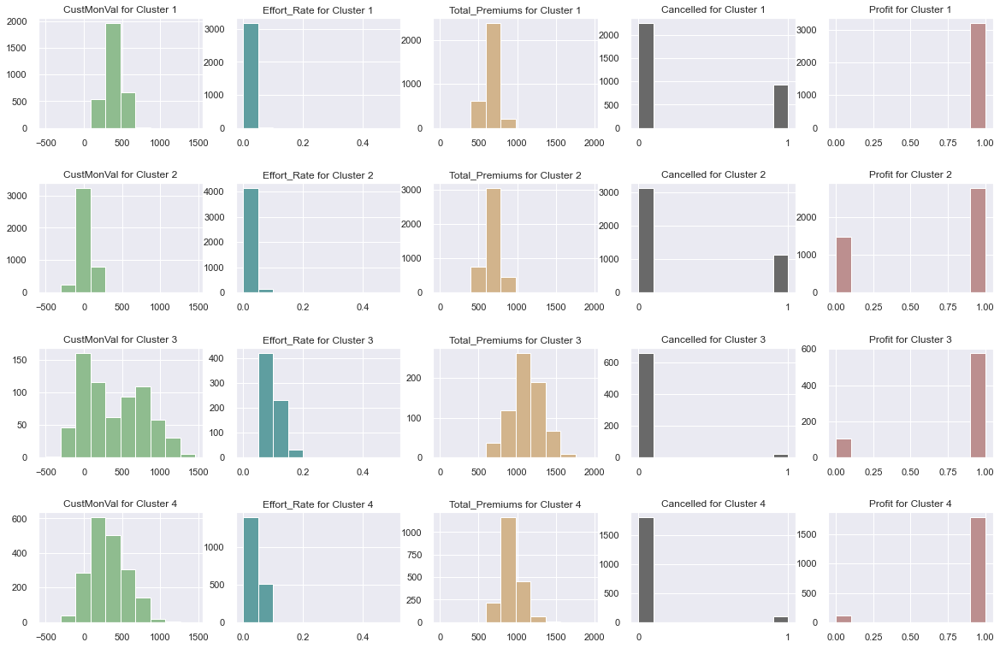

In [158]:
fig, axs = plt.subplots(nrows=4, ncols=5, figsize=(20,13))

# cluster 1
axs[0, 0].hist(data['CustMonVal'].loc[data['Value']==0], color='darkseagreen', range=[-500,1460])
axs[0, 0].set_title('CustMonVal for Cluster 1')
axs[0, 1].hist(data['Effort_Rate'].loc[data['Value']==0], color='cadetblue', range=[0,0.5])
axs[0, 1].set_title('Effort_Rate for Cluster 1')
axs[0, 2].hist(data['Total_Premiums'].loc[data['Value']==0], color='tan', range=[9,1950])
axs[0, 2].set_title('Total_Premiums for Cluster 1')
axs[0, 3].hist(data['Cancelled'].loc[data['Value']==0], color='dimgrey', range=[0,1])
axs[0, 3].set_title('Cancelled for Cluster 1')
plt.sca(axs[0, 3])
plt.xticks([0, 1])
axs[0, 4].hist(data['Profit'].loc[data['Value']==0], color='rosybrown', range=[0,1])
axs[0, 4].set_title('Profit for Cluster 1')

# cluster 2
axs[1, 0].hist(data['CustMonVal'].loc[data['Value']==1], color='darkseagreen', range=[-500,1460])
axs[1, 0].set_title('CustMonVal for Cluster 2')
axs[1, 1].hist(data['Effort_Rate'].loc[data['Value']==1], color='cadetblue', range=[0,0.5])
axs[1, 1].set_title('Effort_Rate for Cluster 2')
axs[1, 2].hist(data['Total_Premiums'].loc[data['Value']==1], color='tan', range=[9,1950])
axs[1, 2].set_title('Total_Premiums for Cluster 2')
axs[1, 3].hist(data['Cancelled'].loc[data['Value']==1], color='dimgrey', range=[0,1])
axs[1, 3].set_title('Cancelled for Cluster 2')
plt.sca(axs[1, 3])
plt.xticks([0, 1])
axs[1, 4].hist(data['Profit'].loc[data['Value']==1], color='rosybrown', range=[0,1])
axs[1, 4].set_title('Profit for Cluster 2')

# cluster 3
axs[2, 0].hist(data['CustMonVal'].loc[data['Value']==2], color='darkseagreen', range=[-500,1460])
axs[2, 0].set_title('CustMonVal for Cluster 3')
axs[2, 1].hist(data['Effort_Rate'].loc[data['Value']==2], color='cadetblue', range=[0,0.5])
axs[2, 1].set_title('Effort_Rate for Cluster 3')
axs[2, 2].hist(data['Total_Premiums'].loc[data['Value']==2], color='tan', range=[9,1950])
axs[2, 2].set_title('Total_Premiums for Cluster 3')
axs[2, 3].hist(data['Cancelled'].loc[data['Value']==2], color='dimgrey', range=[0,1])
axs[2, 3].set_title('Cancelled for Cluster 3')
plt.sca(axs[2, 3])
plt.xticks([0, 1])
axs[2, 4].hist(data['Profit'].loc[data['Value']==2], color='rosybrown', range=[0,1])
axs[2, 4].set_title('Profit for Cluster 3')

# cluster 4
axs[3, 0].hist(data['CustMonVal'].loc[data['Value']==3], color='darkseagreen', range=[-500,1460])
axs[3, 0].set_title('CustMonVal for Cluster 4')
axs[3, 1].hist(data['Effort_Rate'].loc[data['Value']==3], color='cadetblue', range=[0,0.5])
axs[3, 1].set_title('Effort_Rate for Cluster 4')
axs[3, 2].hist(data['Total_Premiums'].loc[data['Value']==3], color='tan', range=[9,1950])
axs[3, 2].set_title('Total_Premiums for Cluster 4')
axs[3, 3].hist(data['Cancelled'].loc[data['Value']==3], color='dimgrey', range=[0,1])
axs[3, 3].set_title('Cancelled for Cluster 4')
plt.sca(axs[3, 3])
plt.xticks([0, 1])
axs[3, 4].hist(data['Profit'].loc[data['Value']==3], color='rosybrown', range=[0,1])
axs[3, 4].set_title('Profit for Cluster 4')

plt.subplots_adjust(hspace=0.5)                                          
plt.show()


In [159]:
#Number of observations in each cluster
data['Value'].value_counts()

1    4275
0    3195
3    1901
2     684
Name: Value, dtype: int64

### 5.3.2) Consumption Perspective <a name="KMHcons"></a>

In [160]:
cons_df = data[consumption_features]

In [161]:
scaler = StandardScaler()
cons_df_scaled = scaler.fit_transform(cons_df)
cons_df_scaled = pd.DataFrame(cons_df_scaled, index=data.index, columns = cons_df.columns)

In [162]:
#Starting with 20 clusters
kmeans = KMeans(n_clusters=20, random_state=0, n_init = 5, max_iter = 200).fit(cons_df_scaled)

In [163]:
clusters = kmeans.cluster_centers_

In [164]:
# save the centroids inverting the normalization
clusters = pd.DataFrame(scaler.inverse_transform(X = clusters),columns = cons_df.columns)

In [165]:
silhouette_avg = silhouette_score(cons_df_scaled, kmeans.labels_)
sample_silhouette_values = silhouette_samples(cons_df_scaled, kmeans.labels_)

In [166]:
del silhouette_avg, sample_silhouette_values

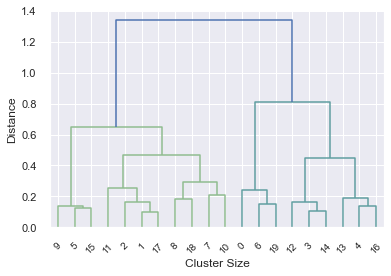

In [167]:
#Checking the Dendrogram
Z = linkage(clusters, method = "ward")

hierarchy.set_link_color_palette(['darkseagreen','cadetblue', 'seagreen', 'mediumseagreen', 'c','mediumturquoise','turquoise'])

#fig = plt.figure(figsize=(10, 20))
#ax2 = fig.add_axes([0.3, 0.71, 0.6, 0.2])
#Z = hierarchy.linkage(clusters, method='ward')

dendrogram(Z,
          truncate_mode="lastp",
          p=40,
          orientation ="top" ,
          leaf_rotation=45.,
          leaf_font_size=10.,
          show_contracted=True,
          show_leaf_counts=True)

#cur_axes = plt.gca()
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()

In [168]:
#Running K-Means with 6 clusters observed on the Dendrogram
kmeans = KMeans(n_clusters=6, random_state=0, n_init = 5, max_iter = 200).fit(cons_df_scaled)

In [169]:
clusters = kmeans.cluster_centers_

In [170]:
# save the centroids inverting the normalization
clusters = pd.DataFrame(scaler.inverse_transform(X = clusters),columns = cons_df.columns)

In [171]:
silhouette_avg = silhouette_score(cons_df_scaled, kmeans.labels_)
sample_silhouette_values = silhouette_samples(cons_df_scaled, kmeans.labels_)

In [172]:
cluster_labels = pd.DataFrame(kmeans.labels_ , index=data_scaled.index)
cluster_labels.columns=['Labels']

In [173]:
cons_df = pd.concat([cons_df, cluster_labels], axis = 1)

In [174]:
del silhouette_avg, sample_silhouette_values, cluster_labels

In [175]:
Hclustering = AgglomerativeClustering(n_clusters=6, affinity="euclidean", linkage="ward")
HC = Hclustering.fit(clusters)

In [176]:
labels = pd.DataFrame(HC.labels_)
labels.columns =  ['Consumption']

In [177]:
clusters = pd.concat([clusters, labels], axis = 1)
clusters['Label']=[i for i in range(0,6)]

In [178]:
j=0
for i in range(0, len(clusters['Consumption'])):
    cons_df['Labels']=cons_df['Labels'].replace(clusters['Label'][i], clusters['Consumption'][j])
    j+=1

In [179]:
data = pd.concat([data, cons_df['Labels']], axis=1)
data.rename(columns={"Labels": "Consumption"}, inplace=True)

In [180]:
sst = get_ss(data_scaled[metric_features])  # get total sum of squares
ssw_labels = get_ss(data[consumption_features + ['Consumption']].groupby(by='Consumption'))  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels) 
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.9983


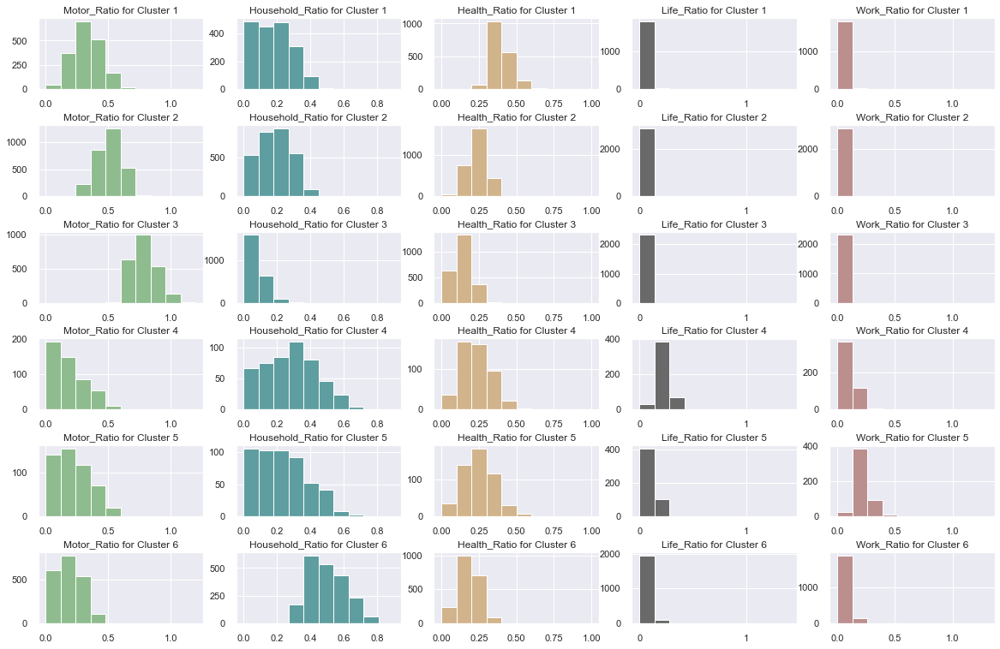

In [181]:
fig, axs = plt.subplots(nrows=6, ncols=5, figsize=(20,13))

# cluster 1
axs[0, 0].hist(data['Motor_Ratio'].loc[data['Consumption']==0], color='darkseagreen', range=[0,1.2])
axs[0, 0].set_title('Motor_Ratio for Cluster 1')
axs[0, 1].hist(data['Household_Ratio'].loc[data['Consumption']==0], color='cadetblue', range=[0,0.9])
axs[0, 1].set_title('Household_Ratio for Cluster 1')
axs[0, 2].hist(data['Health_Ratio'].loc[data['Consumption']==0], color='tan', range=[0,1])
axs[0, 2].set_title('Health_Ratio for Cluster 1')
axs[0, 3].hist(data['Life_Ratio'].loc[data['Consumption']==0], color='dimgrey', range=[0,1.40])
axs[0, 3].set_title('Life_Ratio for Cluster 1')
plt.sca(axs[0, 3])
plt.xticks([0, 1])
axs[0, 4].hist(data['Work_Ratio'].loc[data['Consumption']==0], color='rosybrown', range=[0,1.3])
axs[0, 4].set_title('Work_Ratio for Cluster 1')

# cluster 2
axs[1, 0].hist(data['Motor_Ratio'].loc[data['Consumption']==1], color='darkseagreen', range=[0,1.2])
axs[1, 0].set_title('Motor_Ratio for Cluster 2')
axs[1, 1].hist(data['Household_Ratio'].loc[data['Consumption']==1], color='cadetblue', range=[0,0.9])
axs[1, 1].set_title('Household_Ratio for Cluster 2')
axs[1, 2].hist(data['Health_Ratio'].loc[data['Consumption']==1], color='tan', range=[0,1])
axs[1, 2].set_title('Health_Ratio for Cluster 2')
axs[1, 3].hist(data['Life_Ratio'].loc[data['Consumption']==1], color='dimgrey', range=[0,1.40])
axs[1, 3].set_title('Life_Ratio for Cluster 2')
plt.sca(axs[1, 3])
plt.xticks([0, 1])
axs[1, 4].hist(data['Work_Ratio'].loc[data['Consumption']==1], color='rosybrown', range=[0,1.3])
axs[1, 4].set_title('Work_Ratio for Cluster 2')

# cluster 3
axs[2, 0].hist(data['Motor_Ratio'].loc[data['Consumption']==2], color='darkseagreen', range=[0,1.2])
axs[2, 0].set_title('Motor_Ratio for Cluster 3')
axs[2, 1].hist(data['Household_Ratio'].loc[data['Consumption']==2], color='cadetblue', range=[0,0.9])
axs[2, 1].set_title('Household_Ratio for Cluster 3')
axs[2, 2].hist(data['Health_Ratio'].loc[data['Consumption']==2], color='tan', range=[0,1])
axs[2, 2].set_title('Health_Ratio for Cluster 3')
axs[2, 3].hist(data['Life_Ratio'].loc[data['Consumption']==2], color='dimgrey', range=[0,1.40])
axs[2, 3].set_title('Life_Ratio for Cluster 3')
plt.sca(axs[2, 3])
plt.xticks([0, 1])
axs[2, 4].hist(data['Work_Ratio'].loc[data['Consumption']==2], color='rosybrown', range=[0,1.3])
axs[2, 4].set_title('Work_Ratio for Cluster 3')

# cluster 4
axs[3, 0].hist(data['Motor_Ratio'].loc[data['Consumption']==3], color='darkseagreen', range=[0,1.2])
axs[3, 0].set_title('Motor_Ratio for Cluster 4')
axs[3, 1].hist(data['Household_Ratio'].loc[data['Consumption']==3], color='cadetblue', range=[0,0.9])
axs[3, 1].set_title('Household_Ratio for Cluster 4')
axs[3, 2].hist(data['Health_Ratio'].loc[data['Consumption']==3], color='tan', range=[0,1])
axs[3, 2].set_title('Health_Ratio for Cluster 4')
axs[3, 3].hist(data['Life_Ratio'].loc[data['Consumption']==3], color='dimgrey', range=[0,1.40])
axs[3, 3].set_title('Life_Ratio for Cluster 4')
plt.sca(axs[3, 3])
plt.xticks([0, 1])
axs[3, 4].hist(data['Work_Ratio'].loc[data['Consumption']==3], color='rosybrown', range=[0,1.3])
axs[3, 4].set_title('Work_Ratio for Cluster 4')


# cluster 5
axs[4, 0].hist(data['Motor_Ratio'].loc[data['Consumption']==4], color='darkseagreen', range=[0,1.2])
axs[4, 0].set_title('Motor_Ratio for Cluster 5')
axs[4, 1].hist(data['Household_Ratio'].loc[data['Consumption']==4], color='cadetblue', range=[0,0.9])
axs[4, 1].set_title('Household_Ratio for Cluster 5')
axs[4, 2].hist(data['Health_Ratio'].loc[data['Consumption']==4], color='tan', range=[0,1])
axs[4, 2].set_title('Health_Ratio for Cluster 5')
axs[4, 3].hist(data['Life_Ratio'].loc[data['Consumption']==4], color='dimgrey', range=[0,1.40])
axs[4, 3].set_title('Life_Ratio for Cluster 5')
plt.sca(axs[4, 3])
plt.xticks([0, 1])
axs[4, 4].hist(data['Work_Ratio'].loc[data['Consumption']==4], color='rosybrown', range=[0,1.3])
axs[4, 4].set_title('Work_Ratio for Cluster 5')


# cluster 6
axs[5, 0].hist(data['Motor_Ratio'].loc[data['Consumption']==5], color='darkseagreen', range=[0,1.2])
axs[5, 0].set_title('Motor_Ratio for Cluster 6')
axs[5, 1].hist(data['Household_Ratio'].loc[data['Consumption']==5], color='cadetblue', range=[0,0.9])
axs[5, 1].set_title('Household_Ratio for Cluster 6')
axs[5, 2].hist(data['Health_Ratio'].loc[data['Consumption']==5], color='tan', range=[0,1])
axs[5, 2].set_title('Health_Ratio for Cluster 6')
axs[5, 3].hist(data['Life_Ratio'].loc[data['Consumption']==5], color='dimgrey', range=[0,1.40])
axs[5, 3].set_title('Life_Ratio for Cluster 6')
plt.sca(axs[5, 3])
plt.xticks([0, 1])
axs[5, 4].hist(data['Work_Ratio'].loc[data['Consumption']==5], color='rosybrown', range=[0,1.3])
axs[5, 4].set_title('Work_Ratio for Cluster 6')

plt.subplots_adjust(hspace=0.5)
plt.show()


In [182]:
#Number of observations in each cluster
data['Consumption'].value_counts()

1    2875
2    2317
5    2044
0    1822
4     509
3     488
Name: Consumption, dtype: int64

## 5.4) SOM + Hierarchical Clustering <a name="SOMH"></a>

### 5.4.1) Value Perspective <a name="SOMHvalue"></a>

In [183]:
df_som = data_scaled.copy()

In [184]:
np.random.seed(42)

sm = sompy.SOMFactory().build(
    data_scaled[value_metric_features].values, 
    mapsize=[10, 10],  
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=value_metric_features
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.029000, quantization error: 0.791086

 epoch: 2 ---> elapsed time:  0.044000, quantization error: 1.398647

 epoch: 3 ---> elapsed time:  0.035000, quantization error: 1.305468

 epoch: 4 ---> elapsed time:  0.028000, quantization error: 1.298006

 epoch: 5 ---> elapsed time:  0.056000, quantization error: 1.291891

 epoch: 6 ---> elapsed time:  0.024000, quantization error: 1.276998

 epoch: 7 ---> elapsed time:  0.048000, quantization error: 1.270851

 epoch: 8 ---> elapsed time:  0.022000, quantization error: 1.266963

 epoch: 9 ---> elapsed time:  0.024000, quantization error: 1.263811

 epoch: 10 ---> elapsed time:  0.026000, quantization error: 1.260770

 epoch: 11 ---> elapsed time:  0.065000, quantization error: 1.257656

 epoch: 12 ---> elapsed time:  0.031000, quantization error: 1.254508

 epoch: 13 ---> 

 epoch: 14 ---> elapsed time:  0.040000, quantization error: 0.486726

 epoch: 15 ---> elapsed time:  0.042000, quantization error: 0.486664

 epoch: 16 ---> elapsed time:  0.031000, quantization error: 0.486648

 epoch: 17 ---> elapsed time:  0.038000, quantization error: 0.486627

 epoch: 18 ---> elapsed time:  0.032000, quantization error: 0.486607

 epoch: 19 ---> elapsed time:  0.044000, quantization error: 0.486616

 epoch: 20 ---> elapsed time:  0.023000, quantization error: 0.486609

 epoch: 21 ---> elapsed time:  0.060000, quantization error: 0.486615

 epoch: 22 ---> elapsed time:  0.022000, quantization error: 0.486635

 epoch: 23 ---> elapsed time:  0.056000, quantization error: 0.486630

 epoch: 24 ---> elapsed time:  0.023000, quantization error: 0.486613

 epoch: 25 ---> elapsed time:  0.052000, quantization error: 0.486612

 epoch: 26 ---> elapsed time:  0.030000, quantization error: 0.486605

 epoch: 27 ---> elapsed time:  0.026000, quantization error: 0.486608

 epoch

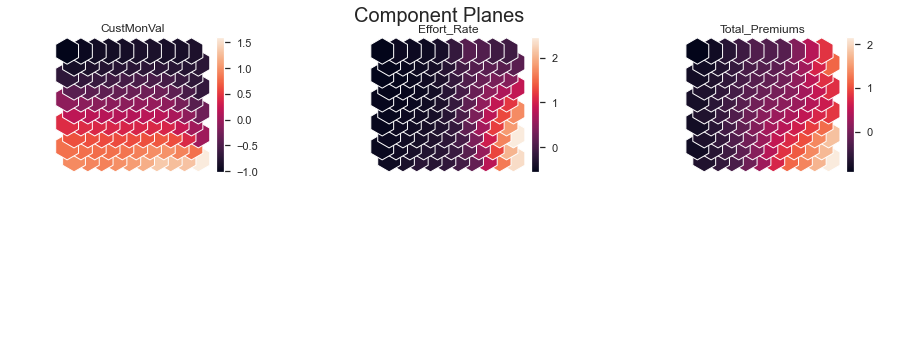

In [185]:
#Checking the component planes
sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

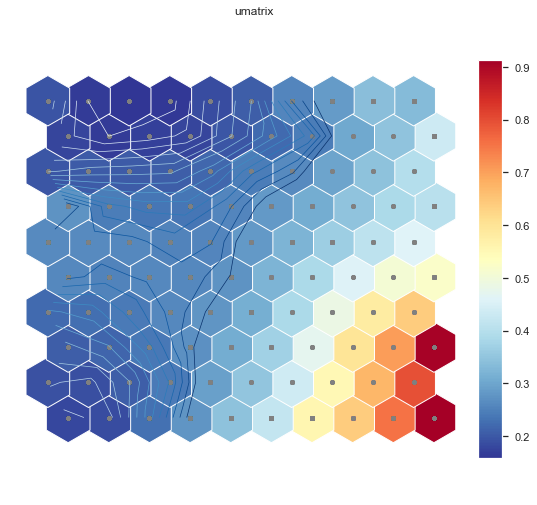

array([[0.19595789, 0.16574012, 0.15797604, 0.16239948, 0.18657567,
        0.20750758, 0.2578505 , 0.28738692, 0.34017587, 0.33254706],
       [0.17599699, 0.16617806, 0.17014174, 0.17719333, 0.19881002,
        0.22084404, 0.24545861, 0.30467508, 0.34702353, 0.43470289],
       [0.19786362, 0.20336598, 0.20443819, 0.20569329, 0.21965911,
        0.24631482, 0.26311976, 0.29828654, 0.3439479 , 0.39944357],
       [0.27345098, 0.24367776, 0.2367742 , 0.23677991, 0.25687553,
        0.28425206, 0.30854044, 0.34760368, 0.38662342, 0.40396545],
       [0.26158587, 0.2631706 , 0.26089029, 0.25305214, 0.25630146,
        0.28431474, 0.32230863, 0.36644496, 0.40903767, 0.46076339],
       [0.25959631, 0.25419363, 0.25984489, 0.26060228, 0.27459757,
        0.32128674, 0.38680792, 0.45774532, 0.50837495, 0.52128151],
       [0.22265138, 0.22745699, 0.24335465, 0.25950303, 0.27606317,
        0.31209151, 0.38616838, 0.48592915, 0.57975789, 0.64150704],
       [0.20523059, 0.21530531, 0.2385834

In [186]:
#Checking the U-Matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1) 

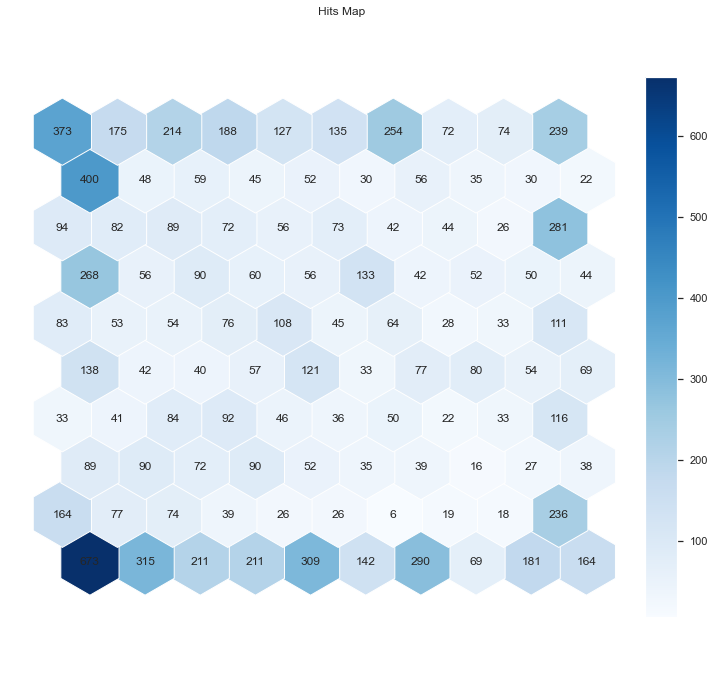

In [187]:
#Checking the Hit Map
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

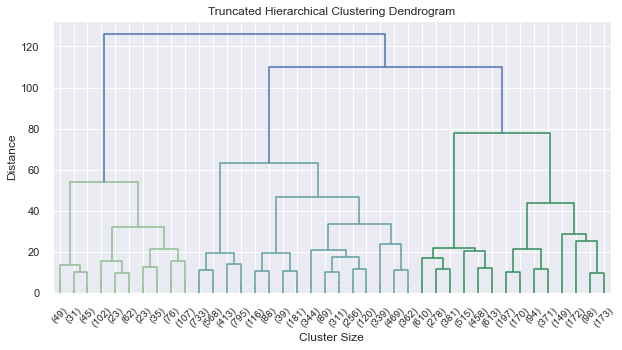

In [188]:
#Checking the Dendrogram
plt.figure(figsize=(10,5))

#Scipy generate dendrograms
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html
Z = linkage(sm._data, method = "ward") # method='single','complete','ward'

#https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.cluster.hierarchy.dendrogram.html
hierarchy.set_link_color_palette(['darkseagreen','cadetblue', 'seagreen', 'mediumseagreen', 'c','mediumturquoise','turquoise'])

dendrogram(Z,
           truncate_mode="lastp",
           p=40,
           orientation ="top" ,
           leaf_rotation=45.,
           leaf_font_size=10.,
           show_contracted=True,
           show_leaf_counts=True)

plt.title('Truncated Hierarchical Clustering Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()

In [189]:
Hclustering = AgglomerativeClustering(n_clusters=5, affinity="euclidean", linkage="ward")

In [190]:
HC = Hclustering.fit(sm._data)

In [191]:
label_SOM_value = pd.DataFrame(HC.labels_ , index= data_scaled.index)
label_SOM_value.columns =  ['Value_SOM']

In [192]:
df_som = pd.DataFrame(pd.concat([df_som, label_SOM_value],axis=1))

In [193]:
sst = get_ss(data_scaled[metric_features])  # get total sum of squares
ssw_labels = get_ss(df_som[value_metric_features + ['Value_SOM']].groupby(by='Value_SOM'))  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.9455


In [194]:
data[value_features].describe()

,CustMonVal,Effort_Rate,Total_Premiums
count,10055.000000,10055.000000,10055.000000
mean,215.371789,0.031181,744.065392
std,247.461874,0.022750,174.320562
min,-406.070000,0.003369,119.680000
25%,-7.880000,0.017737,626.000000
50%,187.820000,0.022966,695.230000
75%,397.755000,0.034921,816.920000
max,1448.280000,0.183221,1668.430000


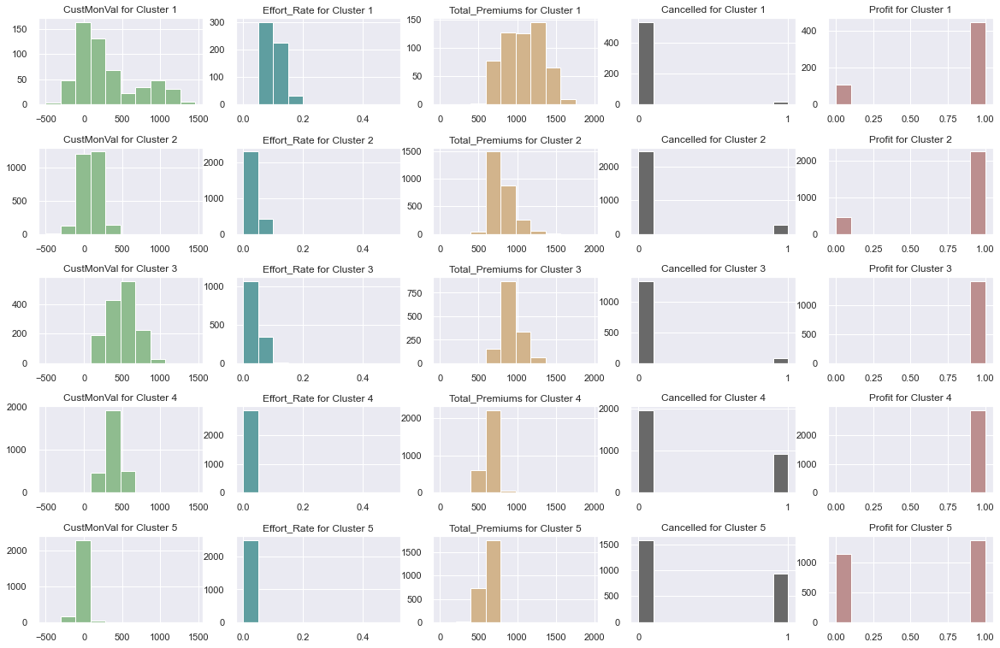

In [195]:
fig, axs = plt.subplots(nrows=5, ncols=5, figsize=(20,13))

# cluster 1
axs[0, 0].hist(data['CustMonVal'].loc[df_som['Value_SOM']==0], color='darkseagreen', range=[-500,1460])
axs[0, 0].set_title('CustMonVal for Cluster 1')
axs[0, 1].hist(data['Effort_Rate'].loc[df_som['Value_SOM']==0], color='cadetblue', range=[0,0.5])
axs[0, 1].set_title('Effort_Rate for Cluster 1')
axs[0, 2].hist(data['Total_Premiums'].loc[df_som['Value_SOM']==0], color='tan', range=[9,1950])
axs[0, 2].set_title('Total_Premiums for Cluster 1')
axs[0, 3].hist(data['Cancelled'].loc[df_som['Value_SOM']==0], color='dimgrey', range=[0,1])
axs[0, 3].set_title('Cancelled for Cluster 1')
plt.sca(axs[0, 3])
plt.xticks([0, 1])
axs[0, 4].hist(data['Profit'].loc[df_som['Value_SOM']==0], color='rosybrown', range=[0,1])
axs[0, 4].set_title('Profit for Cluster 1')

# cluster 2
axs[1, 0].hist(data['CustMonVal'].loc[df_som['Value_SOM']==1], color='darkseagreen', range=[-500,1460])
axs[1, 0].set_title('CustMonVal for Cluster 2')
axs[1, 1].hist(data['Effort_Rate'].loc[df_som['Value_SOM']==1], color='cadetblue', range=[0,0.5])
axs[1, 1].set_title('Effort_Rate for Cluster 2')
axs[1, 2].hist(data['Total_Premiums'].loc[df_som['Value_SOM']==1], color='tan', range=[9,1950])
axs[1, 2].set_title('Total_Premiums for Cluster 2')
axs[1, 3].hist(data['Cancelled'].loc[df_som['Value_SOM']==1], color='dimgrey', range=[0,1])
axs[1, 3].set_title('Cancelled for Cluster 2')
plt.sca(axs[1, 3])
plt.xticks([0, 1])
axs[1, 4].hist(data['Profit'].loc[df_som['Value_SOM']==1], color='rosybrown', range=[0,1])
axs[1, 4].set_title('Profit for Cluster 2')

# cluster 3
axs[2, 0].hist(data['CustMonVal'].loc[df_som['Value_SOM']==2], color='darkseagreen', range=[-500,1460])
axs[2, 0].set_title('CustMonVal for Cluster 3')
axs[2, 1].hist(data['Effort_Rate'].loc[df_som['Value_SOM']==2], color='cadetblue', range=[0,0.5])
axs[2, 1].set_title('Effort_Rate for Cluster 3')
axs[2, 2].hist(data['Total_Premiums'].loc[df_som['Value_SOM']==2], color='tan', range=[9,1950])
axs[2, 2].set_title('Total_Premiums for Cluster 3')
axs[2, 3].hist(data['Cancelled'].loc[df_som['Value_SOM']==2], color='dimgrey', range=[0,1])
axs[2, 3].set_title('Cancelled for Cluster 3')
plt.sca(axs[2, 3])
plt.xticks([0, 1])
axs[2, 4].hist(data['Profit'].loc[df_som['Value_SOM']==2], color='rosybrown', range=[0,1])
axs[2, 4].set_title('Profit for Cluster 3')


# cluster 4
axs[3, 0].hist(data['CustMonVal'].loc[df_som['Value_SOM']==3], color='darkseagreen', range=[-500,1460])
axs[3, 0].set_title('CustMonVal for Cluster 4')
axs[3, 1].hist(data['Effort_Rate'].loc[df_som['Value_SOM']==3], color='cadetblue', range=[0,0.5])
axs[3, 1].set_title('Effort_Rate for Cluster 4')
axs[3, 2].hist(data['Total_Premiums'].loc[df_som['Value_SOM']==3], color='tan', range=[9,1950])
axs[3, 2].set_title('Total_Premiums for Cluster 4')
axs[3, 3].hist(data['Cancelled'].loc[df_som['Value_SOM']==3], color='dimgrey', range=[0,1])
axs[3, 3].set_title('Cancelled for Cluster 4')
plt.sca(axs[3, 3])
plt.xticks([0, 1])
axs[3, 4].hist(data['Profit'].loc[df_som['Value_SOM']==3], color='rosybrown', range=[0,1])
axs[3, 4].set_title('Profit for Cluster 4')


# cluster 5
axs[4, 0].hist(data['CustMonVal'].loc[df_som['Value_SOM']==4], color='darkseagreen', range=[-500,1460])
axs[4, 0].set_title('CustMonVal for Cluster 5')
axs[4, 1].hist(data['Effort_Rate'].loc[df_som['Value_SOM']==4], color='cadetblue', range=[0,0.5])
axs[4, 1].set_title('Effort_Rate for Cluster 5')
axs[4, 2].hist(data['Total_Premiums'].loc[df_som['Value_SOM']==4], color='tan', range=[9,1950])
axs[4, 2].set_title('Total_Premiums for Cluster 5')
axs[4, 3].hist(data['Cancelled'].loc[df_som['Value_SOM']==4], color='dimgrey', range=[0,1])
axs[4, 3].set_title('Cancelled for Cluster 5')
plt.sca(axs[4, 3])
plt.xticks([0, 1])
axs[4, 4].hist(data['Profit'].loc[df_som['Value_SOM']==4], color='rosybrown', range=[0,1])
axs[4, 4].set_title('Profit for Cluster 5')

plt.subplots_adjust(hspace=0.5)                                          
plt.show()


In [196]:
#Number of observations in each cluster
df_som['Value_SOM'].value_counts()

3    2855
1    2714
4    2509
2    1424
0     553
Name: Value_SOM, dtype: int64

### 5.4.2) Consumption Perspective <a name="SOMHcons"></a>

In [197]:
np.random.seed(42)

sm = sompy.SOMFactory().build(
    data_scaled[consumption_features].values, 
    mapsize=[10, 10],  
    initialization='random', 
    neighborhood='gaussian',
    training='batch',
    lattice='hexa',
    component_names=consumption_features
)
sm.train(n_job=4, verbose='info', train_rough_len=100, train_finetune_len=100)

 Training...
 random_initialization took: 0.000000 seconds
 Rough training...
 radius_ini: 4.000000 , radius_final: 1.000000, trainlen: 100

 epoch: 1 ---> elapsed time:  0.028000, quantization error: 1.877283

 epoch: 2 ---> elapsed time:  0.041000, quantization error: 1.910849

 epoch: 3 ---> elapsed time:  0.032000, quantization error: 1.824935

 epoch: 4 ---> elapsed time:  0.025000, quantization error: 1.809508

 epoch: 5 ---> elapsed time:  0.039000, quantization error: 1.800593

 epoch: 6 ---> elapsed time:  0.036000, quantization error: 1.792020

 epoch: 7 ---> elapsed time:  0.027000, quantization error: 1.778434

 epoch: 8 ---> elapsed time:  0.046000, quantization error: 1.771855

 epoch: 9 ---> elapsed time:  0.023000, quantization error: 1.767162

 epoch: 10 ---> elapsed time:  0.031000, quantization error: 1.763266

 epoch: 11 ---> elapsed time:  0.041000, quantization error: 1.759487

 epoch: 12 ---> elapsed time:  0.046000, quantization error: 1.755689

 epoch: 13 ---> 

 epoch: 14 ---> elapsed time:  0.024000, quantization error: 0.848357

 epoch: 15 ---> elapsed time:  0.030000, quantization error: 0.847972

 epoch: 16 ---> elapsed time:  0.041000, quantization error: 0.847837

 epoch: 17 ---> elapsed time:  0.024000, quantization error: 0.847782

 epoch: 18 ---> elapsed time:  0.053000, quantization error: 0.847647

 epoch: 19 ---> elapsed time:  0.023000, quantization error: 0.847554

 epoch: 20 ---> elapsed time:  0.042000, quantization error: 0.847447

 epoch: 21 ---> elapsed time:  0.026000, quantization error: 0.847280

 epoch: 22 ---> elapsed time:  0.034000, quantization error: 0.847283

 epoch: 23 ---> elapsed time:  0.038000, quantization error: 0.847187

 epoch: 24 ---> elapsed time:  0.026000, quantization error: 0.847080

 epoch: 25 ---> elapsed time:  0.048000, quantization error: 0.847026

 epoch: 26 ---> elapsed time:  0.029000, quantization error: 0.846986

 epoch: 27 ---> elapsed time:  0.049000, quantization error: 0.846952

 epoch

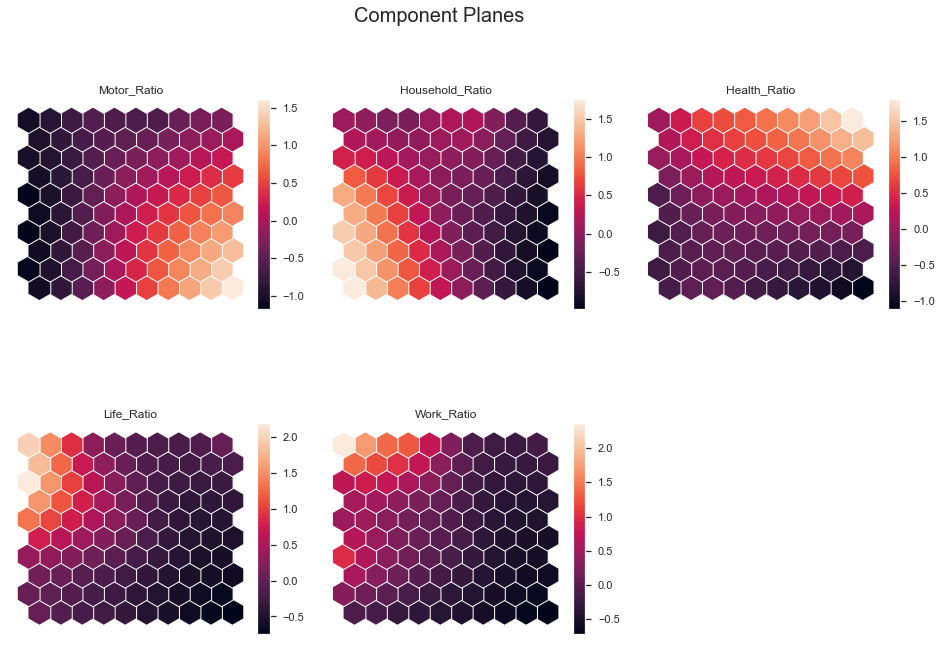

In [198]:
#Checking the component planes
sns.set()
view2D = View2D(12, 12, "", text_size=10)
view2D.show(sm, col_sz=3, what='codebook')
plt.subplots_adjust(top=0.90)
plt.suptitle("Component Planes", fontsize=20)
plt.show()

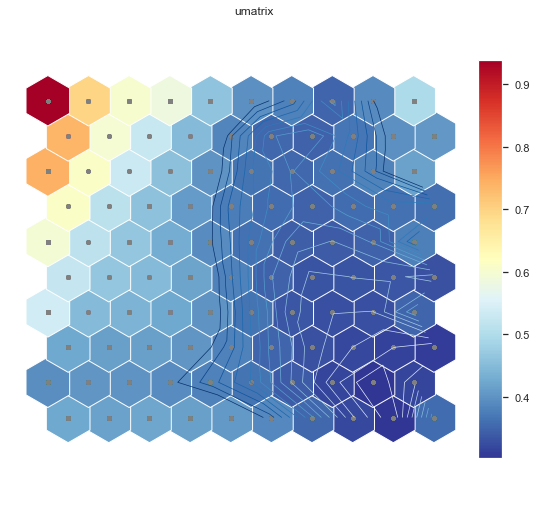

array([[0.9387923 , 0.69950343, 0.6041916 , 0.58499544, 0.46282309,
        0.39861101, 0.38156809, 0.35049075, 0.38949162, 0.4971876 ],
       [0.73736903, 0.59989892, 0.52820058, 0.45120889, 0.3857915 ,
        0.35368521, 0.34689629, 0.36800049, 0.39670281, 0.40414255],
       [0.7437277 , 0.61200172, 0.53274815, 0.45781711, 0.40050244,
        0.36674033, 0.3523553 , 0.36248415, 0.38219732, 0.41729558],
       [0.61294848, 0.51231633, 0.4592708 , 0.40972099, 0.37620615,
        0.35764929, 0.34879168, 0.35742896, 0.36310037, 0.35997857],
       [0.59632827, 0.51476982, 0.46776534, 0.43032451, 0.39251264,
        0.36334297, 0.34367423, 0.33995747, 0.34731399, 0.37681954],
       [0.52590629, 0.46828313, 0.44923858, 0.4190713 , 0.37952031,
        0.34699032, 0.33212319, 0.33403749, 0.33491099, 0.33136454],
       [0.53910697, 0.44994346, 0.44116083, 0.42625634, 0.39987693,
        0.36460682, 0.33545697, 0.32785911, 0.32733797, 0.3507074 ],
       [0.4246399 , 0.41646713, 0.4152630

In [199]:
#Checking the U-Matrix
u = sompy.umatrix.UMatrixView(9, 9, 'umatrix', show_axis=True, text_size=8, show_text=True)

UMAT = u.show(
    sm, 
    distance=2, 
    row_normalized=False,
    show_data=True, 
    contour=True, # Visualize isomorphic curves
    blob=False
)

np.flip(UMAT[1], axis=1) # U-matrix values - they match with the plot colors

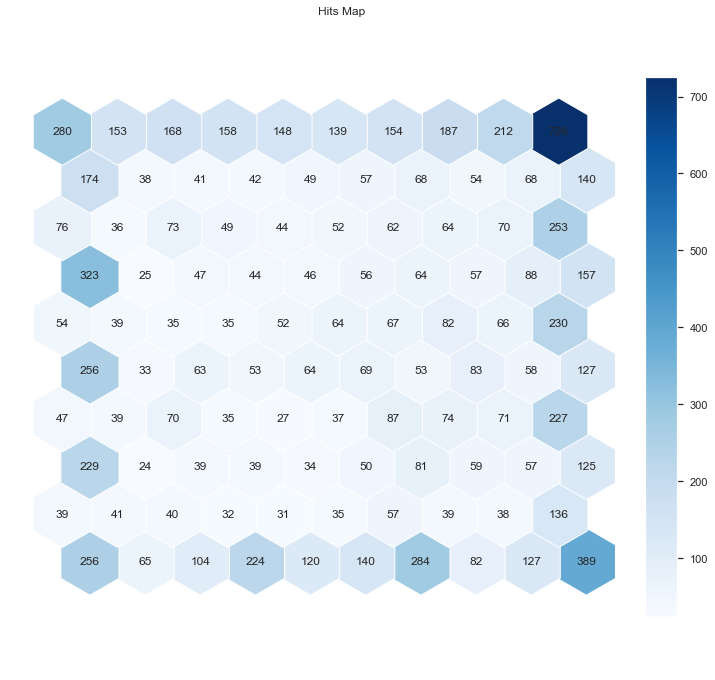

In [200]:
#Checking the Hit Map
vhts  = BmuHitsView(12,12,"Hits Map")
vhts.show(sm, anotate=True, onlyzeros=False, labelsize=12, cmap="Blues")
plt.show()

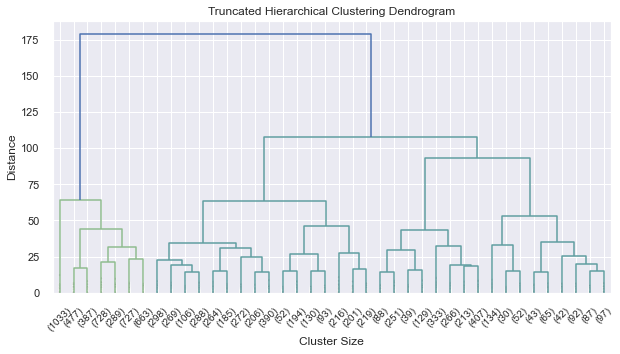

In [201]:
#Checking the Dendrogram
plt.figure(figsize=(10,5))

#Scipy generate dendrograms
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.cluster.hierarchy.linkage.html
Z = linkage(sm._data, method = "ward") # method='single','complete','ward'

#https://docs.scipy.org/doc/scipy-0.14.0/reference/generated/scipy.cluster.hierarchy.dendrogram.html
hierarchy.set_link_color_palette(['darkseagreen','cadetblue', 'seagreen', 'mediumseagreen', 'c','mediumturquoise','turquoise'])

dendrogram(Z,
           truncate_mode="lastp",
           p=40,
           orientation ="top" ,
           leaf_rotation=45.,
           leaf_font_size=10.,
           show_contracted=True,
           show_leaf_counts=True)

plt.title('Truncated Hierarchical Clustering Dendrogram')
plt.xlabel('Cluster Size')
plt.ylabel('Distance')
plt.show()

In [202]:
Hclustering = AgglomerativeClustering(n_clusters=6, affinity="euclidean", linkage="ward")

In [203]:
HC = Hclustering.fit(sm._data)

In [204]:
label_SOM_cons = pd.DataFrame(HC.labels_ , index= data_scaled.index)
label_SOM_cons.columns =  ['Consumption_SOM']

In [205]:
df_som = pd.DataFrame(pd.concat([df_som, label_SOM_cons],axis=1))

In [206]:
sst = get_ss(data_scaled[metric_features])  # get total sum of squares
ssw_labels = get_ss(df_som[consumption_features + ['Consumption_SOM']].groupby(by='Consumption_SOM'))  # compute ssw for each cluster labels
ssb = sst - np.sum(ssw_labels)  
r2 = ssb / sst
print("Cluster solution with R^2 of %0.4f" % r2)

Cluster solution with R^2 of 0.8903


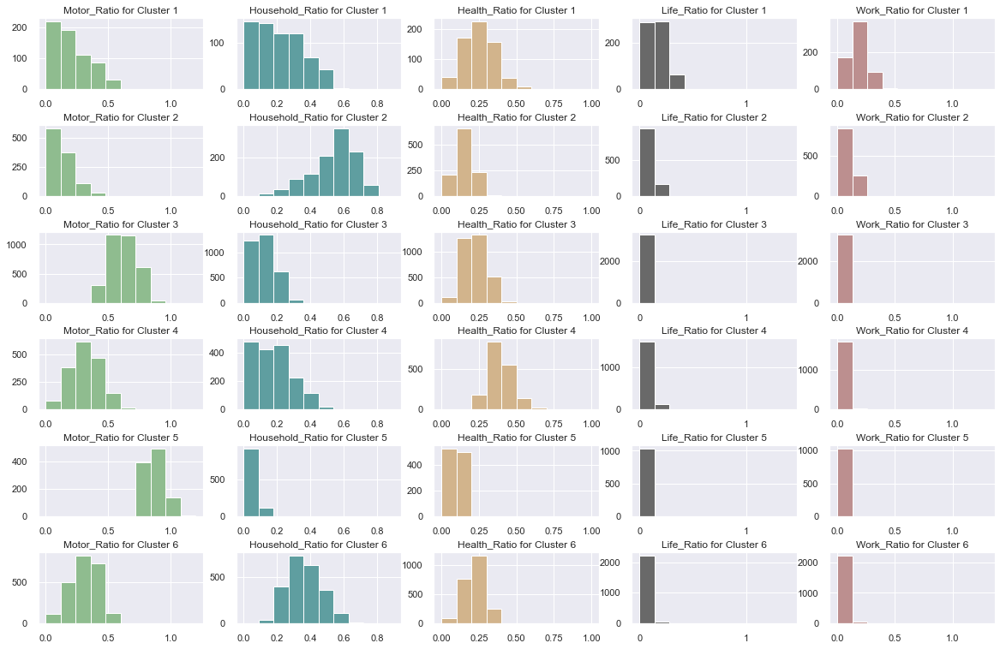

In [207]:
fig, axs = plt.subplots(nrows=6, ncols=5, figsize=(20,13))

# cluster 1
axs[0, 0].hist(data['Motor_Ratio'].loc[df_som['Consumption_SOM']==0], color='darkseagreen', range=[0,1.2])
axs[0, 0].set_title('Motor_Ratio for Cluster 1')
axs[0, 1].hist(data['Household_Ratio'].loc[df_som['Consumption_SOM']==0], color='cadetblue', range=[0,0.9])
axs[0, 1].set_title('Household_Ratio for Cluster 1')
axs[0, 2].hist(data['Health_Ratio'].loc[df_som['Consumption_SOM']==0], color='tan', range=[0,1])
axs[0, 2].set_title('Health_Ratio for Cluster 1')
axs[0, 3].hist(data['Life_Ratio'].loc[df_som['Consumption_SOM']==0], color='dimgrey', range=[0,1.40])
axs[0, 3].set_title('Life_Ratio for Cluster 1')
plt.sca(axs[0, 3])
plt.xticks([0, 1])
axs[0, 4].hist(data['Work_Ratio'].loc[df_som['Consumption_SOM']==0], color='rosybrown', range=[0,1.3])
axs[0, 4].set_title('Work_Ratio for Cluster 1')

# cluster 2
axs[1, 0].hist(data['Motor_Ratio'].loc[df_som['Consumption_SOM']==1], color='darkseagreen', range=[0,1.2])
axs[1, 0].set_title('Motor_Ratio for Cluster 2')
axs[1, 1].hist(data['Household_Ratio'].loc[df_som['Consumption_SOM']==1], color='cadetblue', range=[0,0.9])
axs[1, 1].set_title('Household_Ratio for Cluster 2')
axs[1, 2].hist(data['Health_Ratio'].loc[df_som['Consumption_SOM']==1], color='tan', range=[0,1])
axs[1, 2].set_title('Health_Ratio for Cluster 2')
axs[1, 3].hist(data['Life_Ratio'].loc[df_som['Consumption_SOM']==1], color='dimgrey', range=[0,1.40])
axs[1, 3].set_title('Life_Ratio for Cluster 2')
plt.sca(axs[1, 3])
plt.xticks([0, 1])
axs[1, 4].hist(data['Work_Ratio'].loc[df_som['Consumption_SOM']==1], color='rosybrown', range=[0,1.3])
axs[1, 4].set_title('Work_Ratio for Cluster 2')

# cluster 3
axs[2, 0].hist(data['Motor_Ratio'].loc[df_som['Consumption_SOM']==2], color='darkseagreen', range=[0,1.2])
axs[2, 0].set_title('Motor_Ratio for Cluster 3')
axs[2, 1].hist(data['Household_Ratio'].loc[df_som['Consumption_SOM']==2], color='cadetblue', range=[0,0.9])
axs[2, 1].set_title('Household_Ratio for Cluster 3')
axs[2, 2].hist(data['Health_Ratio'].loc[df_som['Consumption_SOM']==2], color='tan', range=[0,1])
axs[2, 2].set_title('Health_Ratio for Cluster 3')
axs[2, 3].hist(data['Life_Ratio'].loc[df_som['Consumption_SOM']==2], color='dimgrey', range=[0,1.40])
axs[2, 3].set_title('Life_Ratio for Cluster 3')
plt.sca(axs[2, 3])
plt.xticks([0, 1])
axs[2, 4].hist(data['Work_Ratio'].loc[df_som['Consumption_SOM']==2], color='rosybrown', range=[0,1.3])
axs[2, 4].set_title('Work_Ratio for Cluster 3')

# cluster 4
axs[3, 0].hist(data['Motor_Ratio'].loc[df_som['Consumption_SOM']==3], color='darkseagreen', range=[0,1.2])
axs[3, 0].set_title('Motor_Ratio for Cluster 4')
axs[3, 1].hist(data['Household_Ratio'].loc[df_som['Consumption_SOM']==3], color='cadetblue', range=[0,0.9])
axs[3, 1].set_title('Household_Ratio for Cluster 4')
axs[3, 2].hist(data['Health_Ratio'].loc[df_som['Consumption_SOM']==3], color='tan', range=[0,1])
axs[3, 2].set_title('Health_Ratio for Cluster 4')
axs[3, 3].hist(data['Life_Ratio'].loc[df_som['Consumption_SOM']==3], color='dimgrey', range=[0,1.40])
axs[3, 3].set_title('Life_Ratio for Cluster 4')
plt.sca(axs[3, 3])
plt.xticks([0, 1])
axs[3, 4].hist(data['Work_Ratio'].loc[df_som['Consumption_SOM']==3], color='rosybrown', range=[0,1.3])
axs[3, 4].set_title('Work_Ratio for Cluster 4')


# cluster 5
axs[4, 0].hist(data['Motor_Ratio'].loc[df_som['Consumption_SOM']==4], color='darkseagreen', range=[0,1.2])
axs[4, 0].set_title('Motor_Ratio for Cluster 5')
axs[4, 1].hist(data['Household_Ratio'].loc[df_som['Consumption_SOM']==4], color='cadetblue', range=[0,0.9])
axs[4, 1].set_title('Household_Ratio for Cluster 5')
axs[4, 2].hist(data['Health_Ratio'].loc[df_som['Consumption_SOM']==4], color='tan', range=[0,1])
axs[4, 2].set_title('Health_Ratio for Cluster 5')
axs[4, 3].hist(data['Life_Ratio'].loc[df_som['Consumption_SOM']==4], color='dimgrey', range=[0,1.40])
axs[4, 3].set_title('Life_Ratio for Cluster 5')
plt.sca(axs[4, 3])
plt.xticks([0, 1])
axs[4, 4].hist(data['Work_Ratio'].loc[df_som['Consumption_SOM']==4], color='rosybrown', range=[0,1.3])
axs[4, 4].set_title('Work_Ratio for Cluster 5')


# cluster 6
axs[5, 0].hist(data['Motor_Ratio'].loc[df_som['Consumption_SOM']==5], color='darkseagreen', range=[0,1.2])
axs[5, 0].set_title('Motor_Ratio for Cluster 6')
axs[5, 1].hist(data['Household_Ratio'].loc[df_som['Consumption_SOM']==5], color='cadetblue', range=[0,0.9])
axs[5, 1].set_title('Household_Ratio for Cluster 6')
axs[5, 2].hist(data['Health_Ratio'].loc[df_som['Consumption_SOM']==5], color='tan', range=[0,1])
axs[5, 2].set_title('Health_Ratio for Cluster 6')
axs[5, 3].hist(data['Life_Ratio'].loc[df_som['Consumption_SOM']==5], color='dimgrey', range=[0,1.40])
axs[5, 3].set_title('Life_Ratio for Cluster 6')
plt.sca(axs[5, 3])
plt.xticks([0, 1])
axs[5, 4].hist(data['Work_Ratio'].loc[df_som['Consumption_SOM']==5], color='rosybrown', range=[0,1.3])
axs[5, 4].set_title('Work_Ratio for Cluster 6')

plt.subplots_adjust(hspace=0.5)
plt.show()


In [208]:
#Number of observations in each cluster
df_som['Consumption_SOM'].value_counts()

2    3271
5    2278
3    1726
1    1105
4    1033
0     642
Name: Consumption_SOM, dtype: int64

## 5.5) Cluster Analysis <a name="ClusterAnalysis"></a>

### 5.5.1) Merging the Perspectives <a name="MergePerpectives"></a>

In [209]:
#Renaming columns with the labels in order to know which model they are related to
data.rename(columns={'Value':'Value_Kmeans', 'Consumption': 'Consumption_Kmeans'}, inplace=True)

In [210]:
# Count label frequencies (contigency table)
data.groupby(['Consumption_Kmeans', 'Value_Kmeans'])\
    .size()\
    .to_frame()\
    .reset_index()\
    .pivot('Value_Kmeans', 'Consumption_Kmeans', 0)

Consumption_Kmeans,0,1,2,3,4,5
Value_Kmeans,,,,,,
0,554.0,1289.0,1101.0,77.0,102.0,72.0
1,1044.0,1328.0,1215.0,200.0,257.0,231.0
2,20.0,12.0,NaN,73.0,47.0,532.0
3,204.0,246.0,1.0,138.0,103.0,1209.0


### Merging using Hierarchical clustering

In [211]:
cluster_metric = value_metric_features + consumption_features

In [212]:
data_scaled = data_scaled.merge(data[['Value_Kmeans','Consumption_Kmeans']],  left_index=True, right_index=True)

In [213]:
# Centroids of the concatenated cluster labels
df_centroids = data_scaled.groupby(['Value_Kmeans', 'Consumption_Kmeans'])\
    [cluster_metric].mean()
df_centroids

CustMonVal  Effort_Rate  Total_Premiums  \
Value_Kmeans Consumption_Kmeans                                            
0            0                     0.322657    -0.389300       -0.412931   
             1                     0.687001    -0.336635       -0.319268   
             2                     0.949200    -0.409344       -0.762509   
             3                     0.501200    -0.227504       -0.303135   
             4                     0.487675    -0.375548       -0.414909   
             5                     0.916172    -0.415686        0.289395   
1            0                    -0.714411    -0.295127       -0.436347   
             1                    -0.777160    -0.323018       -0.331681   
             2                    -0.950392    -0.410617       -0.747961   
             3                    -0.880817    -0.085636       -0.341012   
             4                    -0.837604    -0.090058       -0.385918   
             5                    -0.945066    -0.241497        0.557074   
2            0                    -0.229059     2.811579        0.045862   
             1                     0.189013     2.344158        0.167143   
             3                     0.262380     2.404874        1.097126   
             4                     0.039478     2.229875        1.062898   
             5                     0.879795     2.128004        2.314798   
3            0                     0.157251     0.509329        0.272629   
             1                     0.407947     0.177778        0.313755   
             2                    -0.014314    -0.297969        0.358411   
             3                     0.174908     0.577410        0.582064   
             4                     0.086390     0.672779        0.582491   
             5                     0.476182     0.079051        1.204160   

                                 Motor_Ratio  Household_Ratio  Health_Ratio  \
Value_Kmeans Consumption_Kmeans                                               
0            0                     -0.292184        -0.405403      1.376389   
             1                      0.312666        -0.294957      0.055212   
             2                      1.405635        -0.906571     -0.827582   
             3                     -0.652892        -0.187680      0.173592   
             4                     -0.525297        -0.371161      0.097873   
             5                     -0.620063         0.720309     -0.257191   
1            0                     -0.427149        -0.397703      1.585741   
             1                      0.319350        -0.310993      0.067613   
             2                      1.389801        -0.896037     -0.819803   
             3                     -0.809645        -0.250889      0.415666   
             4                     -0.759426        -0.367553      0.537671   
             5                     -0.687950         0.861744     -0.221126   
2            0                     -0.861285         0.213999      1.341081   
             1                     -0.202285         0.380820      0.064308   
             3                     -1.455289         1.218118     -0.719635   
             4                     -1.464790         1.165750     -0.592657   
             5                     -1.405501         2.027871     -0.758041   
3            0                     -0.883806         0.461324      1.277466   
             1                     -0.153931         0.492895     -0.168237   
             2                      0.688413         0.419813     -1.751780   
             3                     -1.276534         0.792760     -0.304050   
             4                     -1.241628         0.771149     -0.335999   
             5                     -0.927745         1.339832     -0.361879   

                                 Life_Ratio  Work_Ratio  
Value_Kmeans Consumption_Kmeans                          
0            0                    -0.022

In [214]:
# Using Hierarchical clustering to merge the concatenated cluster centroids
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    distance_threshold=0, 
    n_clusters=None
)
hclust_labels = hclust.fit_predict(df_centroids)

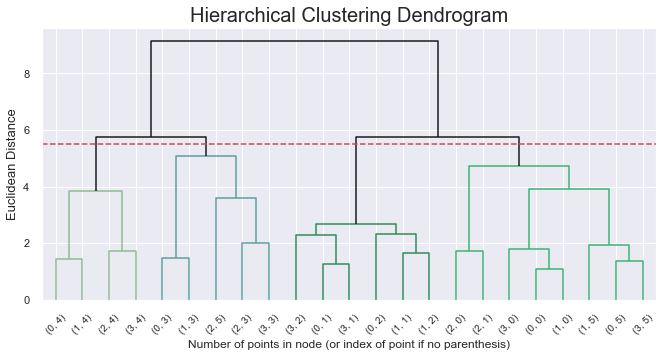

In [215]:
# Adapted from:
# https://scikit-learn.org/stable/auto_examples/cluster/plot_agglomerative_dendrogram.html#sphx-glr-auto-examples-cluster-plot-agglomerative-dendrogram-py

# create the counts of samples under each node (number of points being merged)
counts = np.zeros(hclust.children_.shape[0])
n_samples = len(hclust.labels_)

# hclust.children_ contains the observation ids that are being merged together
# At the i-th iteration, children[i][0] and children[i][1] are merged to form node n_samples + i
for i, merge in enumerate(hclust.children_):
    # track the number of observations in the current cluster being formed
    current_count = 0
    for child_idx in merge:
        if child_idx < n_samples:
            # If this is True, then we are merging an observation
            current_count += 1  # leaf node
        else:
            # Otherwise, we are merging a previously formed cluster
            current_count += counts[child_idx - n_samples]
    counts[i] = current_count

# the hclust.children_ is used to indicate the two points/clusters being merged (dendrogram's u-joins)
# the hclust.distances_ indicates the distance between the two points/clusters (height of the u-joins)
# the counts indicate the number of points being merged (dendrogram's x-axis)
linkage_matrix = np.column_stack(
    [hclust.children_, hclust.distances_, counts]
).astype(float)

# Plot the corresponding dendrogram
sns.set()
fig = plt.figure(figsize=(11,5))
# The Dendrogram parameters need to be tuned
y_threshold = 5.5
dendrogram(linkage_matrix, truncate_mode='level', labels=df_centroids.index, p=5, color_threshold=y_threshold, above_threshold_color='k')
plt.hlines(y_threshold, 0, 1000, colors="r", linestyles="dashed")
plt.title(f'Hierarchical Clustering Dendrogram', fontsize=20)
plt.xlabel('Number of points in node (or index of point if no parenthesis)')
plt.ylabel(f'Euclidean Distance', fontsize=13)
plt.show()

In [216]:
df_centroids

CustMonVal  Effort_Rate  Total_Premiums  \
Value_Kmeans Consumption_Kmeans                                            
0            0                     0.322657    -0.389300       -0.412931   
             1                     0.687001    -0.336635       -0.319268   
             2                     0.949200    -0.409344       -0.762509   
             3                     0.501200    -0.227504       -0.303135   
             4                     0.487675    -0.375548       -0.414909   
             5                     0.916172    -0.415686        0.289395   
1            0                    -0.714411    -0.295127       -0.436347   
             1                    -0.777160    -0.323018       -0.331681   
             2                    -0.950392    -0.410617       -0.747961   
             3                    -0.880817    -0.085636       -0.341012   
             4                    -0.837604    -0.090058       -0.385918   
             5                    -0.945066    -0.241497        0.557074   
2            0                    -0.229059     2.811579        0.045862   
             1                     0.189013     2.344158        0.167143   
             3                     0.262380     2.404874        1.097126   
             4                     0.039478     2.229875        1.062898   
             5                     0.879795     2.128004        2.314798   
3            0                     0.157251     0.509329        0.272629   
             1                     0.407947     0.177778        0.313755   
             2                    -0.014314    -0.297969        0.358411   
             3                     0.174908     0.577410        0.582064   
             4                     0.086390     0.672779        0.582491   
             5                     0.476182     0.079051        1.204160   

                                 Motor_Ratio  Household_Ratio  Health_Ratio  \
Value_Kmeans Consumption_Kmeans                                               
0            0                     -0.292184        -0.405403      1.376389   
             1                      0.312666        -0.294957      0.055212   
             2                      1.405635        -0.906571     -0.827582   
             3                     -0.652892        -0.187680      0.173592   
             4                     -0.525297        -0.371161      0.097873   
             5                     -0.620063         0.720309     -0.257191   
1            0                     -0.427149        -0.397703      1.585741   
             1                      0.319350        -0.310993      0.067613   
             2                      1.389801        -0.896037     -0.819803   
             3                     -0.809645        -0.250889      0.415666   
             4                     -0.759426        -0.367553      0.537671   
             5                     -0.687950         0.861744     -0.221126   
2            0                     -0.861285         0.213999      1.341081   
             1                     -0.202285         0.380820      0.064308   
             3                     -1.455289         1.218118     -0.719635   
             4                     -1.464790         1.165750     -0.592657   
             5                     -1.405501         2.027871     -0.758041   
3            0                     -0.883806         0.461324      1.277466   
             1                     -0.153931         0.492895     -0.168237   
             2                      0.688413         0.419813     -1.751780   
             3                     -1.276534         0.792760     -0.304050   
             4                     -1.241628         0.771149     -0.335999   
             5                     -0.927745         1.339832     -0.361879   

                                 Life_Ratio  Work_Ratio  
Value_Kmeans Consumption_Kmeans                          
0            0                    -0.022

In [217]:
# Re-running the Hierarchical clustering based on the correct number of clusters
hclust = AgglomerativeClustering(
    linkage='ward', 
    affinity='euclidean', 
    n_clusters=4
)
hclust_labels = hclust.fit_predict(df_centroids)
df_centroids['hclust_labels'] = hclust_labels

df_centroids  # centroid's cluster labels

CustMonVal  Effort_Rate  Total_Premiums  \
Value_Kmeans Consumption_Kmeans                                            
0            0                     0.322657    -0.389300       -0.412931   
             1                     0.687001    -0.336635       -0.319268   
             2                     0.949200    -0.409344       -0.762509   
             3                     0.501200    -0.227504       -0.303135   
             4                     0.487675    -0.375548       -0.414909   
             5                     0.916172    -0.415686        0.289395   
1            0                    -0.714411    -0.295127       -0.436347   
             1                    -0.777160    -0.323018       -0.331681   
             2                    -0.950392    -0.410617       -0.747961   
             3                    -0.880817    -0.085636       -0.341012   
             4                    -0.837604    -0.090058       -0.385918   
             5                    -0.945066    -0.241497        0.557074   
2            0                    -0.229059     2.811579        0.045862   
             1                     0.189013     2.344158        0.167143   
             3                     0.262380     2.404874        1.097126   
             4                     0.039478     2.229875        1.062898   
             5                     0.879795     2.128004        2.314798   
3            0                     0.157251     0.509329        0.272629   
             1                     0.407947     0.177778        0.313755   
             2                    -0.014314    -0.297969        0.358411   
             3                     0.174908     0.577410        0.582064   
             4                     0.086390     0.672779        0.582491   
             5                     0.476182     0.079051        1.204160   

                                 Motor_Ratio  Household_Ratio  Health_Ratio  \
Value_Kmeans Consumption_Kmeans                                               
0            0                     -0.292184        -0.405403      1.376389   
             1                      0.312666        -0.294957      0.055212   
             2                      1.405635        -0.906571     -0.827582   
             3                     -0.652892        -0.187680      0.173592   
             4                     -0.525297        -0.371161      0.097873   
             5                     -0.620063         0.720309     -0.257191   
1            0                     -0.427149        -0.397703      1.585741   
             1                      0.319350        -0.310993      0.067613   
             2                      1.389801        -0.896037     -0.819803   
             3                     -0.809645        -0.250889      0.415666   
             4                     -0.759426        -0.367553      0.537671   
             5                     -0.687950         0.861744     -0.221126   
2            0                     -0.861285         0.213999      1.341081   
             1                     -0.202285         0.380820      0.064308   
             3                     -1.455289         1.218118     -0.719635   
             4                     -1.464790         1.165750     -0.592657   
             5                     -1.405501         2.027871     -0.758041   
3            0                     -0.883806         0.461324      1.277466   
             1                     -0.153931         0.492895     -0.168237   
             2                      0.688413         0.419813     -1.751780   
             3                     -1.276534         0.792760     -0.304050   
             4                     -1.241628         0.771149     -0.335999   
             5                     -0.927745         1.339832     -0.361879   

                                 Life_Ratio  Work_Ratio  hclust_labels  
Value_Kmeans Consumption_Kmeans                                         
0         

In [218]:
# Mapper between concatenated clusters and hierarchical clusters
cluster_mapper = df_centroids['hclust_labels'].to_dict()

df_ = data_scaled.copy()

# Mapping the hierarchical clusters on the centroids to the observations
df_['merged_labels'] = df_.apply(
    lambda row: cluster_mapper[
        (row['Value_Kmeans'], row['Consumption_Kmeans'])
    ], axis=1
)

# Merged cluster centroids
df_.groupby('merged_labels').mean()[cluster_metric]

,CustMonVal,Effort_Rate,Total_Premiums,Motor_Ratio,Household_Ratio,Health_Ratio,Life_Ratio,Work_Ratio
merged_labels,,,,,,,,
0,0.366442,1.326168,1.274847,-1.217967,1.188747,-0.393402,1.475214,0.569449
1,-0.034061,-0.097329,0.292761,-0.637468,0.398669,0.657238,0.082124,0.049696
2,-0.030085,-0.341514,-0.487020,0.777250,-0.532499,-0.345446,-0.454824,-0.444346
3,-0.304062,0.221315,-0.061982,-0.875217,0.003731,0.168373,0.706230,2.685138


In [219]:
#Merge cluster contigency table
# Getting size of each final cluster
df_counts = df_.groupby('merged_labels')\
    .size()\
    .to_frame()

# Getting the value and consumption labels
df_counts = df_counts\
    .rename({v:k for k, v in cluster_mapper.items()})\
    .reset_index()

df_counts['Value_Kmeans'] = df_counts['merged_labels'].apply(lambda x: x[0])
df_counts['Consumption_Kmeans'] = df_counts['merged_labels'].apply(lambda x: x[1])
df_counts.pivot('Value_Kmeans', 'Consumption_Kmeans', 0)

Consumption_Kmeans,2,3,4,5
Value_Kmeans,,,,
3,5180,1020,509,3346


In [220]:
# Setting df to have the final value, consumption and merged clusters
data_cluster = df_.copy()

### 5.5.2) Cluster Profiles <a name="ClusterProfiles"></a>

In [221]:
def cluster_profiles(df, label_columns, figsize, compar_titles=None):
    """
    Pass df with labels columns of one or multiple clustering labels. 
    Then specify this label columns to perform the cluster profile according to them.
    """
    if compar_titles == None:
        compar_titles = [""]*len(label_columns)
        
    sns.set()
    fig, axes = plt.subplots(nrows=len(label_columns), ncols=2, figsize=figsize, squeeze=False)
    for ax, label, titl in zip(axes, label_columns, compar_titles):
        # Filtering df
        drop_cols = [i for i in label_columns if i!=label]
        dfax = df.drop(drop_cols, axis=1)
        
        # Getting the cluster centroids and counts
        centroids = dfax.groupby(by=label, as_index=False).mean()
        counts = dfax.groupby(by=label, as_index=False).count().iloc[:,[0,1]]
        counts.columns = [label, "counts"]
        
        # Setting Data
        pd.plotting.parallel_coordinates(centroids, label, color=sns.color_palette(), ax=ax[0])
        sns.barplot(x=label, y="counts", data=counts, ax=ax[1])

        #Setting Layout
        handles, _ = ax[0].get_legend_handles_labels()
        cluster_labels = ["Cluster {}".format(i) for i in range(len(handles))]
        ax[0].annotate(text=titl, xy=(0.95,1.1), xycoords='axes fraction', fontsize=13, fontweight = 'heavy') 
        ax[0].legend(handles, cluster_labels) # Adaptable to number of clusters
        ax[0].axhline(color="black", linestyle="--")
        ax[0].set_title("Cluster Means - {} Clusters".format(len(handles)), fontsize=13)
        ax[0].set_xticklabels(ax[0].get_xticklabels(), rotation=-20)
        ax[1].set_xticklabels(cluster_labels)
        ax[1].set_xlabel("")
        ax[1].set_ylabel("Absolute Frequency")
        ax[1].set_title("Cluster Sizes - {} Clusters".format(len(handles)), fontsize=13)
    
    plt.subplots_adjust(hspace=0.4, top=0.90)
    plt.suptitle("Cluster Simple Profilling", fontsize=23)
    plt.show()

In [222]:
data_cluster

,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,EducDeg,Children,PremMotor,PremHousehold,PremHealth,PremLife,...,Effort_Rate,Motor_Ratio,Household_Ratio,Health_Ratio,Life_Ratio,Work_Ratio,Cancelled,Value_Kmeans,Consumption_Kmeans,merged_labels
CustID,,,,,,,,,,,,,,,,,,,,,
1.0,-0.153331,-0.324806,0.649847,-0.911840,2.0,1.0,0.567818,-0.544638,-0.284546,0.119151,...,-0.256281,0.495554,-0.588453,-0.101613,0.302801,-0.464282,0,0,1,2
2.0,-0.759048,-1.849436,-1.375382,1.372808,2.0,1.0,-1.591153,0.949416,-0.682120,3.230330,...,2.686406,-1.422993,1.208973,-0.931484,2.735977,1.115959,0,2,3,0
3.0,0.755245,-0.223164,1.139050,-1.256102,1.0,0.0,-0.660030,0.098903,-0.576395,0.949108,...,-0.201016,-0.649768,0.390174,-0.568843,1.085645,1.414209,0,0,4,3
4.0,0.603816,-1.420507,-0.923986,0.965953,3.0,1.0,-0.831291,-0.704803,1.923889,-0.127051,...,0.425286,-0.548043,-0.839848,2.593153,0.101838,-0.086197,0,1,0,1
5.0,-0.001901,-0.745604,-0.717469,0.684284,3.0,1.0,0.298444,-0.685059,0.200932,-0.476418,...,-0.111417,0.389279,-0.819629,0.533566,-0.391890,0.237967,0,1,1,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
10291.0,1.209533,-1.901274,-0.159730,0.527801,1.0,1.0,-2.101756,3.000497,-0.863823,1.511766,...,4.767978,-1.741934,2.366948,-1.373813,0.577350,1.774564,0,2,5,0
10292.0,-0.304760,0.702794,-0.857230,0.872063,4.0,0.0,0.697260,-0.677739,0.083281,-0.666291,...,-0.551952,0.691577,-0.813701,0.359494,-0.640585,-0.504853,0,1,1,2
10294.0,1.209533,0.428361,1.215891,-1.475177,3.0,1.0,0.768818,-0.307941,-0.339619,-0.605321,...,-0.446228,0.555612,-0.208389,-0.242562,-0.590278,-0.782558,0,0,1,2


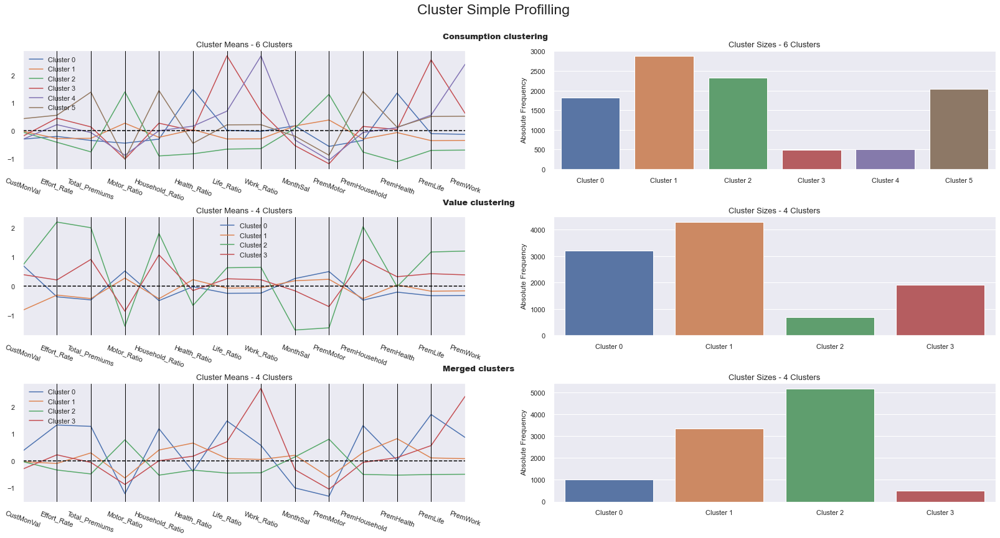

In [223]:
#Checking the cluster profiles of the value, consumption and merged perspectives
cluster_profiles(
    data_cluster[cluster_metric + ['MonthSal', 'PremMotor', 'PremHousehold', 'PremHealth', 'PremLife','PremWork'] + ['Consumption_Kmeans', 'Value_Kmeans', 'merged_labels']], 
    label_columns = ['Consumption_Kmeans', 'Value_Kmeans', 'merged_labels'], 
    figsize = (28, 13), 
    compar_titles = ["Consumption clustering", "Value clustering", "Merged clusters"]
)

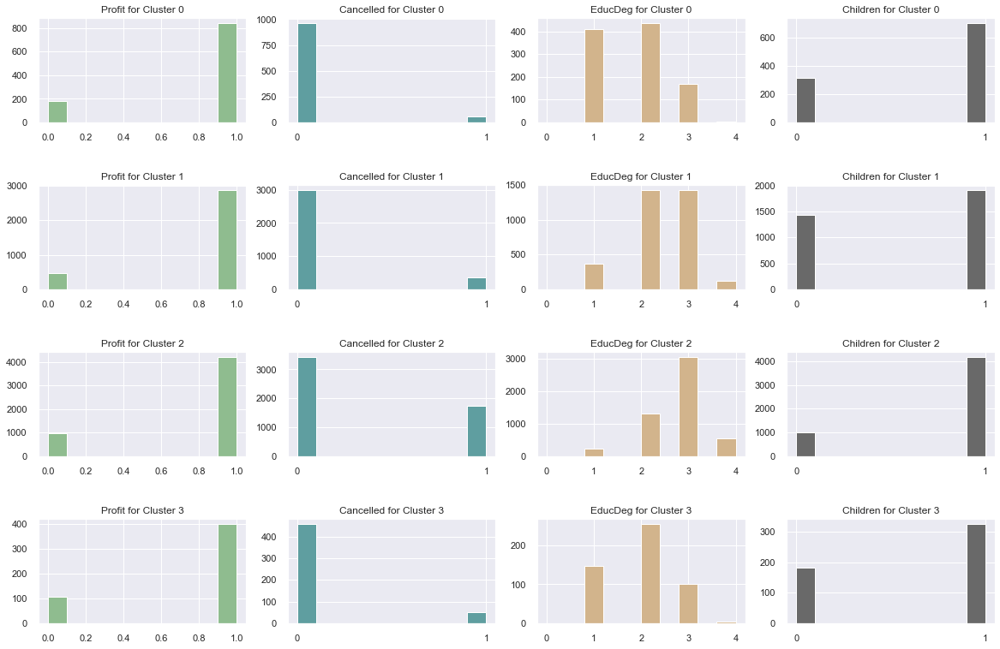

In [224]:
fig, axs = plt.subplots(nrows=4, ncols=4, figsize=(20,13))

# cluster 0
axs[0, 0].hist(data_cluster['Profit'].loc[data_cluster['merged_labels']==0], color='darkseagreen',  range=[0,1])
axs[0, 0].set_title('Profit for Cluster 0')
axs[0, 1].hist(data_cluster['Cancelled'].loc[data_cluster['merged_labels']==0], color='cadetblue',  range=[0,1])
axs[0, 1].set_title('Cancelled for Cluster 0')
axs[0, 2].hist(data_cluster['EducDeg'].loc[data_cluster['merged_labels']==0], color='tan', range=[0,4])
axs[0, 2].set_title('EducDeg for Cluster 0')
axs[0, 3].hist(data_cluster['Children'].loc[data_cluster['merged_labels']==0], color='dimgrey',  range=[0,1])
axs[0, 3].set_title('Children for Cluster 0')
plt.sca(axs[0, 3])
plt.xticks([0, 1])

# cluster 1
axs[1, 0].hist(data_cluster['Profit'].loc[data_cluster['merged_labels']==1], color='darkseagreen',  range=[0,1])
axs[1, 0].set_title('Profit for Cluster 1')
axs[1, 1].hist(data_cluster['Cancelled'].loc[data_cluster['merged_labels']==1], color='cadetblue',  range=[0,1])
axs[1, 1].set_title('Cancelled for Cluster 1')
axs[1, 2].hist(data_cluster['EducDeg'].loc[data_cluster['merged_labels']==1], color='tan', range=[0,4])
axs[1, 2].set_title('EducDeg for Cluster 1')
axs[1, 3].hist(data_cluster['Children'].loc[data_cluster['merged_labels']==1], color='dimgrey',  range=[0,1])
axs[1, 3].set_title('Children for Cluster 1')
plt.sca(axs[1, 3])
plt.xticks([0, 1])

# cluster 2
axs[2, 0].hist(data_cluster['Profit'].loc[data_cluster['merged_labels']==2], color='darkseagreen',  range=[0,1])
axs[2, 0].set_title('Profit for Cluster 2')
axs[2, 1].hist(data_cluster['Cancelled'].loc[data_cluster['merged_labels']==2], color='cadetblue',  range=[0,1])
axs[2, 1].set_title('Cancelled for Cluster 2')
axs[2, 2].hist(data_cluster['EducDeg'].loc[data_cluster['merged_labels']==2], color='tan', range=[0,4])
axs[2, 2].set_title('EducDeg for Cluster 2')
axs[2, 3].hist(data_cluster['Children'].loc[data_cluster['merged_labels']==2], color='dimgrey',  range=[0,1])
axs[2, 3].set_title('Children for Cluster 2')
plt.sca(axs[2, 3])
plt.xticks([0, 1])

# cluster 3
axs[3, 0].hist(data_cluster['Profit'].loc[data_cluster['merged_labels']==3], color='darkseagreen',  range=[0,1])
axs[3, 0].set_title('Profit for Cluster 3')
axs[3, 1].hist(data_cluster['Cancelled'].loc[data_cluster['merged_labels']==3], color='cadetblue',  range=[0,1])
axs[3, 1].set_title('Cancelled for Cluster 3')
axs[3, 2].hist(data_cluster['EducDeg'].loc[data_cluster['merged_labels']==3], color='tan', range=[0,4])
axs[3, 2].set_title('EducDeg for Cluster 3')
axs[3, 3].hist(data_cluster['Children'].loc[data_cluster['merged_labels']==3], color='dimgrey',  range=[0,1])
axs[3, 3].set_title('Children for Cluster 3')
plt.sca(axs[3, 3])
plt.xticks([0, 1])

plt.subplots_adjust(hspace=0.6)
plt.show()

### 5.5.3) Cluster visualization <a name="ClusterVisualization"></a>

### 5.5.3.1) t-SNE <a name="tsne"></a>

In [225]:
df_pca = data_cluster[cluster_metric].copy()

In [226]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca)
pca_feat 

array([[-7.19389659e-01, -3.09060876e-01, -7.29427186e-02, ...,
         9.23643955e-02, -6.17781832e-02, -3.60330816e-02],
       [ 3.46712731e+00,  1.09621676e+00,  2.46520265e+00, ...,
         1.55594824e+00,  3.43552388e-01, -4.46442667e-03],
       [ 1.35765440e+00,  1.06652216e-01,  7.61208410e-01, ...,
        -5.28081742e-01,  2.79018691e-01,  1.49927728e-03],
       ...,
       [-7.65652076e-01, -1.17707419e+00, -7.35572224e-01, ...,
        -1.15323539e-01,  9.80477234e-02, -2.26041034e-02],
       [ 1.21768633e+00,  9.42467469e-01,  4.82908708e-01, ...,
        -2.55602279e-01,  7.31145244e-03, -4.74789429e-03],
       [-1.06688826e+00, -9.62316397e-01, -5.72927071e-01, ...,
        -2.08923725e-02,  2.28063906e-02, -3.10758071e-02]])

In [227]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.123347,0.000000,0.439733,0.439733
2,1.522352,-1.600995,0.214331,0.654064
3,0.818422,-0.703930,0.115225,0.769289
4,0.735105,-0.083317,0.103495,0.872783
5,0.526032,-0.209073,0.074060,0.946843
6,0.335252,-0.190780,0.047200,0.994043
7,0.039085,-0.296167,0.005503,0.999546
8,0.003227,-0.035858,0.000454,1.000000


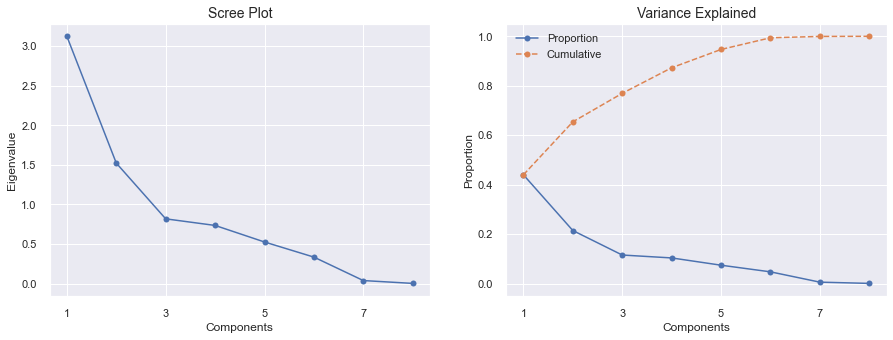

In [228]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [229]:
# Perform PCA again with the number of principal components to retain
pca = PCA(n_components=3)
pca_feat = pca.fit_transform(df_pca)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df = pd.DataFrame(pca_feat, index=df_pca.index, columns=pca_feat_names)
pca_df

,PC0,PC1,PC2
CustID,,,
1.0,-0.719390,-0.309061,-0.072943
2.0,3.467127,1.096217,2.465203
3.0,1.357654,0.106652,0.761208
4.0,-0.548234,2.526641,-1.277007
5.0,-1.059983,0.817000,0.101911
...,...,...,...
10291.0,5.654682,-1.008005,1.569000
10292.0,-1.587844,0.360255,-0.115643
10294.0,-0.765652,-1.177074,-0.735572


In [230]:
pca_df = pd.concat([pca_df, data_cluster['merged_labels']], axis=1)

In [231]:
two_dim = TSNE(random_state=42).fit_transform(pca_df)

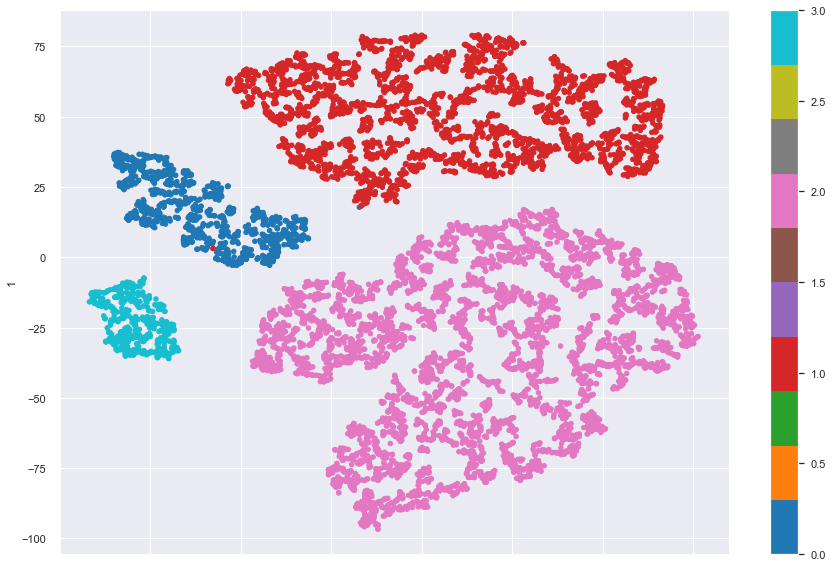

In [232]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=pca_df['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()

### 5.5.3.2) UMAP <a name="umap"></a>

In [233]:
df_UMAP = pca_df.copy()

In [234]:
features = df_UMAP.loc[:, :'PC2']

In [235]:
features

,PC0,PC1,PC2
CustID,,,
1.0,-0.719390,-0.309061,-0.072943
2.0,3.467127,1.096217,2.465203
3.0,1.357654,0.106652,0.761208
4.0,-0.548234,2.526641,-1.277007
5.0,-1.059983,0.817000,0.101911
...,...,...,...
10291.0,5.654682,-1.008005,1.569000
10292.0,-1.587844,0.360255,-0.115643
10294.0,-0.765652,-1.177074,-0.735572


In [238]:
umap_2d = UMAP(n_components=2, init='random', random_state=0)
umap_3d = UMAP(n_components=3, init='random', random_state=0)


In [239]:
proj_2d = umap_2d.fit_transform(features)
proj_3d = umap_3d.fit_transform(features)


In [240]:
fig_2d = px.scatter(
    proj_2d, x=0, y=1,
    color=pca_df.merged_labels, labels={'color': 'merged_labels'}
)

fig_3d = px.scatter_3d(
    proj_3d, x=0, y=1, z=2,
    color=pca_df.merged_labels, labels={'color': 'merged_labels'}
)
fig_3d.update_traces(marker_size=5)

fig_2d.show()
fig_3d.show()

### 5.5.4) Assess feature importance and reclassify outliers <a name="FeatImport"></a>

### 5.5.4.1) Using the R²<a name="FeatImportR2"></a>

In [241]:
def get_ss_variables(df):
    """Get the SS for each variable
    """
    ss_vars = df.var() * (df.count() - 1)
    return ss_vars

def r2_variables(df, labels):
    """Get the R² for each variable
    """
    sst_vars = get_ss_variables(df)
    ssw_vars = get_ss_variables(df.groupby(labels)).sum()
    return 1 - ssw_vars/sst_vars

In [242]:
# We are essentially decomposing the R² into the R² for each variable
r2_variables(data_cluster[cluster_metric + ['merged_labels']], 'merged_labels').drop('merged_labels')

CustMonVal         0.019974
Effort_Rate        0.402501
Health_Ratio       0.227036
Household_Ratio    0.358504
Life_Ratio         0.411469
Motor_Ratio        0.646978
Total_Premiums     0.354251
Work_Ratio         0.566574
dtype: float64

### 5.5.4.2) Using a Decision Tree <a name="FeatImportdt"></a>

In [243]:
# Preparing the data
X = data_cluster.drop(columns=['Consumption_Kmeans','Value_Kmeans','merged_labels'])
y = data_cluster.merged_labels

# Splitting the data
X_train, X_test, y_train, y_test = train_test_split(
    X, y, test_size=0.2, random_state=42
)

# Fitting the decision tree
dt = DecisionTreeClassifier(random_state=42, max_depth=3)
dt.fit(X_train, y_train)
print("It is estimated that in average, we are able to predict {0:.2f}% of the customers correctly".format(dt.score(X_test, y_test)*100))

It is estimated that in average, we are able to predict 88.41% of the customers correctly


In [244]:
# Assessing feature importance
pd.Series(dt.feature_importances_, index=X_train.columns)

FirstPolYear       0.000000
MonthSal           0.000000
CustMonVal         0.000000
ClaimsRate         0.000000
EducDeg            0.000000
Children           0.000000
PremMotor          0.656879
PremHousehold      0.000000
PremHealth         0.000000
PremLife           0.000000
PremWork           0.000000
Client_Years       0.000000
Yearly_Salary      0.000000
Total_Premiums     0.000000
Profit             0.000000
Effort_Rate        0.128122
Motor_Ratio        0.000000
Household_Ratio    0.043018
Health_Ratio       0.046751
Life_Ratio         0.000000
Work_Ratio         0.125230
Cancelled          0.000000
dtype: float64

In [245]:
outliers = backup.loc[out]

In [246]:
# Predicting the cluster labels of the outliers
outliers['merged_labels'] = dt.predict(outliers)
outliers.head()

,FirstPolYear,MonthSal,CustMonVal,ClaimsRate,EducDeg,Children,PremMotor,PremHousehold,PremHealth,PremLife,...,Total_Premiums,Profit,Effort_Rate,Motor_Ratio,Household_Ratio,Health_Ratio,Life_Ratio,Work_Ratio,Cancelled,merged_labels
CustID,,,,,,,,,,,,,,,,,,,,,
3083.0,-1.819053,-1.394080,-1.037409,1.028546,2.0,1.0,-0.987287,5.487926,-0.641921,-0.896038,...,5.350982,0,3.250946,-1.392809,3.185132,-1.466934,-0.900227,-0.709213,1,0
8716.0,-1.364765,-1.634972,-0.554415,0.527801,1.0,1.0,-1.362008,-0.436161,0.056481,5.131805,...,-0.389460,1,1.036409,-1.118475,-0.407006,0.204191,6.258852,-0.707922,0,1
6671.0,-1.061906,-1.420507,-0.314440,0.715581,1.0,0.0,-1.866171,5.357266,-0.603195,0.763876,...,5.327503,1,3.343212,-1.672085,3.105713,-1.450310,-0.138236,-0.058530,0,0
5137.0,-1.061906,-2.156395,2.883769,-1.318695,1.0,1.0,-0.775000,3.136038,-1.073799,0.972526,...,3.062736,1,8.803841,-1.184508,2.456683,-1.488274,0.232375,-0.363643,0,0
2581.0,-1.061906,-2.180789,2.266313,-1.068322,1.0,1.0,-2.053496,2.869837,-0.562995,3.204592,...,2.598076,1,8.790017,-1.718970,2.453929,-1.165994,1.777332,-0.228675,0,0


<module 'matplotlib.pyplot' from 'C:\\Users\\josed\\anaconda3\\lib\\site-packages\\matplotlib\\pyplot.py'>

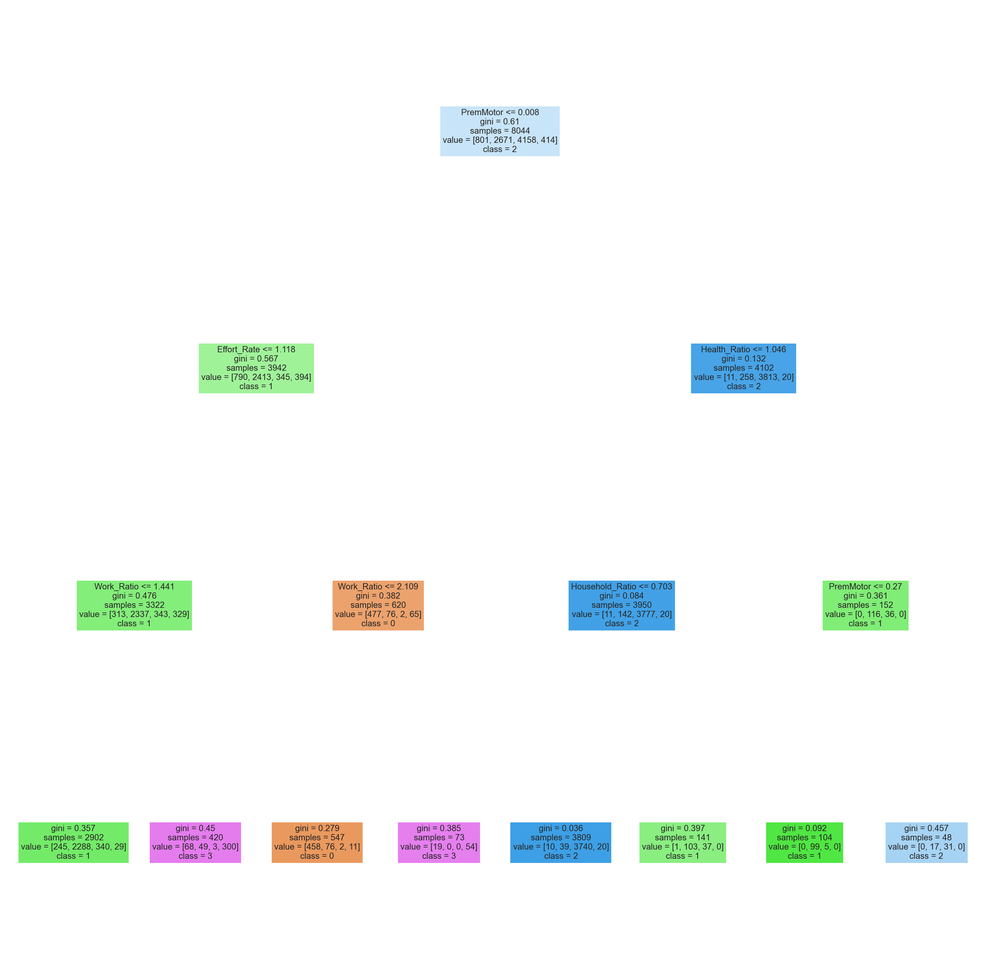

In [249]:
#Visualizing the decision tree
fn = list(data_cluster.columns)
cn = ['0','1','2','3']

fig, axes = plt.subplots(nrows = 1,ncols = 1,figsize = (10,10), dpi=300)

tree.plot_tree(dt, 
                   feature_names=fn,  
                   class_names=cn,
                   filled=True)

fig.savefig('imagename.png')
plt

### 5.5.5) t-SNE with the outliers <a name="tsneout"></a>

In [250]:
outliers_df.isna().sum()

CustID           0
FirstPolYear     0
EducDeg          0
MonthSal         0
GeoLivArea       0
Children         0
CustMonVal       0
ClaimsRate       0
PremMotor        0
PremHousehold    0
PremHealth       0
PremLife         0
PremWork         0
dtype: int64

In [251]:
data_cluster_outliers = pd.concat([data_cluster.drop(['Value_Kmeans', 'Consumption_Kmeans'], axis=1), outliers], axis=0)

In [252]:
df_pca_outliers = data_cluster_outliers[cluster_metric].copy()

In [253]:
# Use PCA to reduce dimensionality of data
pca = PCA()
pca_feat = pca.fit_transform(df_pca_outliers)
pca_feat 

array([[-0.77362093, -0.28751601,  0.17976864, ...,  0.25709771,
        -0.06619418, -0.04029973],
       [ 3.55354053,  1.34801626,  2.01797064, ...,  1.0766535 ,
         0.35424307, -0.02225903],
       [ 1.23619441,  0.39241928,  1.06127692, ..., -0.48801724,
         0.28210089, -0.02261548],
       ...,
       [ 4.87733591, -0.18088531, -0.13968111, ...,  5.00546723,
         0.75070572,  0.01446064],
       [ 5.8186072 , -2.09639737, -0.59122372, ...,  0.1707852 ,
        -1.34405559,  0.03264244],
       [ 7.15870297, -4.81809948, -1.647596  , ...,  2.16873047,
        -1.40413029,  0.02604706]])

In [254]:
# Output PCA table
pd.DataFrame(
    {"Eigenvalue": pca.explained_variance_,
     "Difference": np.insert(np.diff(pca.explained_variance_), 0, 0),
     "Proportion": pca.explained_variance_ratio_,
     "Cumulative": np.cumsum(pca.explained_variance_ratio_)},
    index=range(1, pca.n_components_ + 1)
)

,Eigenvalue,Difference,Proportion,Cumulative
1,3.474841,0.000000,0.434313,0.434313
2,1.637404,-1.837437,0.204655,0.638968
3,0.917849,-0.719555,0.114720,0.753688
4,0.800887,-0.116962,0.100101,0.853789
5,0.587775,-0.213113,0.073465,0.927254
6,0.530266,-0.057508,0.066277,0.993530
7,0.046477,-0.483789,0.005809,0.999339
8,0.005285,-0.041192,0.000661,1.000000


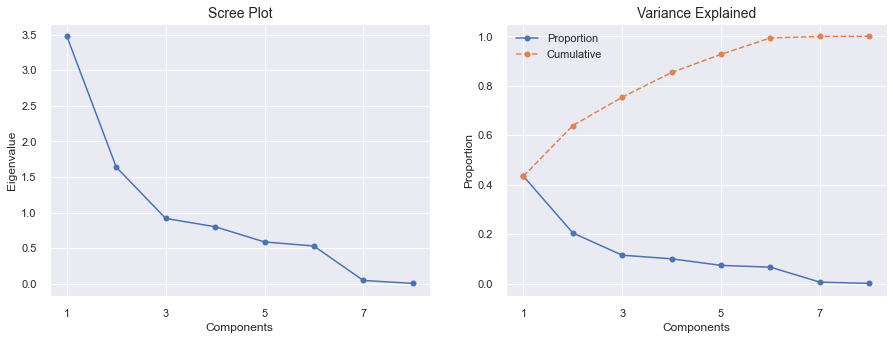

In [255]:
# figure and axes
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

# draw plots
ax1.plot(pca.explained_variance_, marker=".", markersize=12)
ax2.plot(pca.explained_variance_ratio_, marker=".", markersize=12, label="Proportion")
ax2.plot(np.cumsum(pca.explained_variance_ratio_), marker=".", markersize=12, linestyle="--", label="Cumulative")

# customizations
ax2.legend()
ax1.set_title("Scree Plot", fontsize=14)
ax2.set_title("Variance Explained", fontsize=14)
ax1.set_ylabel("Eigenvalue")
ax2.set_ylabel("Proportion")
ax1.set_xlabel("Components")
ax2.set_xlabel("Components")
ax1.set_xticks(range(0, pca.n_components_, 2))
ax1.set_xticklabels(range(1, pca.n_components_ + 1, 2))
ax2.set_xticks(range(0, pca.n_components_, 2))
ax2.set_xticklabels(range(1, pca.n_components_ + 1, 2))

plt.show()

In [256]:
# Perform PCA again with the number of principal components to retain
pca = PCA(n_components=3)
pca_feat = pca.fit_transform(df_pca_outliers)
pca_feat_names = [f"PC{i}" for i in range(pca.n_components_)]
pca_df_outliers = pd.DataFrame(pca_feat, index=df_pca_outliers.index, columns=pca_feat_names)
pca_df_outliers

,PC0,PC1,PC2
CustID,,,
1.0,-0.773621,-0.287516,0.179769
2.0,3.553541,1.348016,2.017971
3.0,1.236194,0.392419,1.061277
4.0,-0.678148,2.285311,-1.516824
5.0,-1.124437,0.731096,-0.005368
...,...,...,...
6124.0,3.738348,0.764114,0.029777
2546.0,6.466815,-2.762922,-0.380588
6132.0,4.877336,-0.180885,-0.139681


In [257]:
pca_df_outliers = pd.concat([pca_df_outliers, data_cluster_outliers['merged_labels']], axis=1)

In [258]:
two_dim = TSNE(random_state=42).fit_transform(pca_df_outliers)

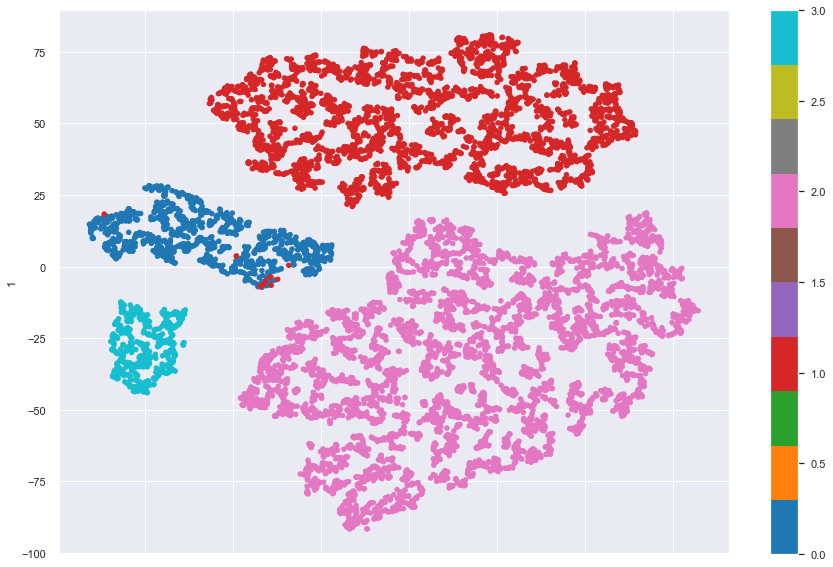

In [259]:
# t-SNE visualization
pd.DataFrame(two_dim).plot.scatter(x=0, y=1, c=pca_df_outliers['merged_labels'], colormap='tab10', figsize=(15,10))
plt.show()